# Project - Unsupervised Learning

In [1]:
# imports
import seaborn as sns
import pandas_profiling
import matplotlib.pyplot as plt
import pandas as pd, numpy as np
from collections import defaultdict
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline, make_pipeline
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix

# Part One

* DOMAIN: Automobile
* CONTEXT: The data concerns city-cycle fuel consumption in miles per gallon, to be predicted in terms of 3 multivalued discrete and 5 continuous attributes
* DATA DESCRIPTION: The data concerns city-cycle fuel consumption in miles per gallon
* Attribute Information:
    1. mpg: continuous
    2. cylinders: multi-valued discrete
    3. displacement: continuous
    4. horsepower: continuous
    5. weight: continuous
    6. acceleration: continuous
    7. model year: multi-valued discrete
    8. origin: multi-valued discrete
    9. car name: string (unique for each instance)
* PROJECT OBJECTIVE: Goal is to cluster the data and treat them as individual datasets to train Regression models to predict ‘mpg’

### 1. Import and warehouse data:
* Import all the given datasets and explore shape and size.
* Merge all datasets onto one and explore final shape and size.
* Export the final dataset and store it on local machine in .csv, .xlsx and .json format for future use.
* Import the data from above steps into python.

##### The data containing nine attributes is stored in two separate files (Car name.csv and Car Attributes.json) which is often case in the real-world data which might be stored in multiple formats at multiple places. So, we read in the dataframes and concatenate to a single dataframe

In [2]:
car_names = pd.read_csv('Part1 - Car name.csv')
car_names.T

,0,1,2,3,4,5,6,7,8,9,...,388,389,390,391,392,393,394,395,396,397
car_name,chevrolet chevelle malibu,buick skylark 320,plymouth satellite,amc rebel sst,ford torino,ford galaxie 500,chevrolet impala,plymouth fury iii,pontiac catalina,amc ambassador dpl,...,chrysler lebaron medallion,ford granada l,toyota celica gt,dodge charger 2.2,chevrolet camaro,ford mustang gl,vw pickup,dodge rampage,ford ranger,chevy s-10


In [3]:
car_names.shape

(398, 1)

In [4]:
car_attr = pd.read_json('Part1 - Car-Attributes.json')
car_attr.T

,0,1,2,3,4,5,6,7,8,9,...,388,389,390,391,392,393,394,395,396,397
mpg,18,15,18,16,17,15,14,14,14,15,...,26,22,32,36,27,27,44,32,28,31
cyl,8,8,8,8,8,8,8,8,8,8,...,4,6,4,4,4,4,4,4,4,4
disp,307,350,318,304,302,429,454,440,455,390,...,156,232,144,135,151,140,97,135,120,119
hp,130,165,150,150,140,198,220,215,225,190,...,92,112,96,84,90,86,52,84,79,82
wt,3504,3693,3436,3433,3449,4341,4354,4312,4425,3850,...,2585,2835,2665,2370,2950,2790,2130,2295,2625,2720
acc,12,11.5,11,12,10.5,10,9,8.5,10,8.5,...,14.5,14.7,13.9,13,17.3,15.6,24.6,11.6,18.6,19.4
yr,70,70,70,70,70,70,70,70,70,70,...,82,82,82,82,82,82,82,82,82,82
origin,1,1,1,1,1,1,1,1,1,1,...,1,1,3,1,1,1,2,1,1,1


In [5]:
car_attr.shape

(398, 8)

In [6]:
car_df = pd.concat([car_names, car_attr], axis = 1) # row-wise concatenation
car_df.sample(7)

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
145,datsun 710,32.0,4,83.0,61,2003,19.0,74,3
323,dodge colt,27.9,4,156.0,105,2800,14.4,80,1
37,amc matador,18.0,6,232.0,100,3288,15.5,71,1
227,plymouth volare custom,19.0,6,225.0,100,3630,17.7,77,1
303,datsun 210,31.8,4,85.0,65,2020,19.2,79,3
270,toyota celica gt liftback,21.1,4,134.0,95,2515,14.8,78,3
384,honda civic (auto),32.0,4,91.0,67,1965,15.7,82,3


In [7]:
car_df.shape

(398, 9)

In [8]:
# store the complete df into local files for future use
car_df.to_csv('car_raw.csv', index = False)
car_df.to_json('car_raw.json')
car_df.to_excel('car_raw.xlsx', index = False)

In [9]:
#stored the raw data in various formats for easy access
!ls car*

car_raw.csv
car_raw.json
car_raw.xlsx


In [10]:
car_df = pd.read_csv('car_raw.csv')

In [11]:
car_df.shape

(398, 9)

In [12]:
car_df.T

,0,1,2,3,4,5,6,7,8,9,...,388,389,390,391,392,393,394,395,396,397
car_name,chevrolet chevelle malibu,buick skylark 320,plymouth satellite,amc rebel sst,ford torino,ford galaxie 500,chevrolet impala,plymouth fury iii,pontiac catalina,amc ambassador dpl,...,chrysler lebaron medallion,ford granada l,toyota celica gt,dodge charger 2.2,chevrolet camaro,ford mustang gl,vw pickup,dodge rampage,ford ranger,chevy s-10
mpg,18,15,18,16,17,15,14,14,14,15,...,26,22,32,36,27,27,44,32,28,31
cyl,8,8,8,8,8,8,8,8,8,8,...,4,6,4,4,4,4,4,4,4,4
disp,307,350,318,304,302,429,454,440,455,390,...,156,232,144,135,151,140,97,135,120,119
hp,130,165,150,150,140,198,220,215,225,190,...,92,112,96,84,90,86,52,84,79,82
wt,3504,3693,3436,3433,3449,4341,4354,4312,4425,3850,...,2585,2835,2665,2370,2950,2790,2130,2295,2625,2720
acc,12,11.5,11,12,10.5,10,9,8.5,10,8.5,...,14.5,14.7,13.9,13,17.3,15.6,24.6,11.6,18.6,19.4
yr,70,70,70,70,70,70,70,70,70,70,...,82,82,82,82,82,82,82,82,82,82
origin,1,1,1,1,1,1,1,1,1,1,...,1,1,3,1,1,1,2,1,1,1


### 2. Data cleansing:
* Missing/incorrect value treatment
* Drop attribute/s if required using relevant functional knowledge
* Perform another kind of corrections/treatment on the data.

In [13]:
car_df.isna().sum() # no missing values across the data, data is complete; Hence, no missing value treatment necessary

car_name    0
mpg         0
cyl         0
disp        0
hp          0
wt          0
acc         0
yr          0
origin      0
dtype: int64

In [14]:
car_df.columns

Index(['car_name', 'mpg', 'cyl', 'disp', 'hp', 'wt', 'acc', 'yr', 'origin'], dtype='object')

##### To predict mpg of a car, the car_name (which is unique for each car) doesn't add any information to help the clustering task; So, we drop car_name variable

In [15]:
car_df.drop(['car_name'], axis = 1, inplace = True)
car_df.shape

(398, 8)

In [16]:
car_df.hp.unique() # we discover that hp has a value '?' which is an alias for a missing value

array(['130', '165', '150', '140', '198', '220', '215', '225', '190',
       '170', '160', '95', '97', '85', '88', '46', '87', '90', '113',
       '200', '210', '193', '?', '100', '105', '175', '153', '180', '110',
       '72', '86', '70', '76', '65', '69', '60', '80', '54', '208', '155',
       '112', '92', '145', '137', '158', '167', '94', '107', '230', '49',
       '75', '91', '122', '67', '83', '78', '52', '61', '93', '148',
       '129', '96', '71', '98', '115', '53', '81', '79', '120', '152',
       '102', '108', '68', '58', '149', '89', '63', '48', '66', '139',
       '103', '125', '133', '138', '135', '142', '77', '62', '132', '84',
       '64', '74', '116', '82'], dtype=object)

In [17]:
car_df[car_df.hp == '?'].shape # 6 such entries

(6, 8)

In [18]:
car_df[car_df.hp == '?'] 

,mpg,cyl,disp,hp,wt,acc,yr,origin
32,25.0,4,98.0,?,2046,19.0,71,1
126,21.0,6,200.0,?,2875,17.0,74,1
330,40.9,4,85.0,?,1835,17.3,80,2
336,23.6,4,140.0,?,2905,14.3,80,1
354,34.5,4,100.0,?,2320,15.8,81,2
374,23.0,4,151.0,?,3035,20.5,82,1


In [19]:
car_df.hp = car_df.hp.replace(['?'], np.nan) # replace with nans to impute later
car_df.hp.isna().sum()

6

##### Impute the 6 values with nearest neighbor imputation

In [20]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=3)
filled_arr = imputer.fit_transform(car_df)
car_df = pd.DataFrame(filled_arr, columns = car_df.columns)
car_df.isna().sum() # no more missing values!

mpg       0
cyl       0
disp      0
hp        0
wt        0
acc       0
yr        0
origin    0
dtype: int64

In [21]:
car_df.value_counts()

mpg   cyl  disp   hp     wt      acc   yr    origin
46.6  4.0  86.0   65.0   2110.0  17.9  80.0  3.0       1
18.1  6.0  258.0  120.0  3410.0  15.1  78.0  1.0       1
18.2  8.0  318.0  135.0  3830.0  15.2  79.0  1.0       1
18.5  6.0  250.0  98.0   3525.0  19.0  77.0  1.0       1
                  110.0  3645.0  16.2  76.0  1.0       1
                                                      ..
27.0  4.0  97.0   88.0   2130.0  14.5  70.0  3.0       1
                                       71.0  3.0       1
           101.0  83.0   2202.0  15.3  76.0  2.0       1
           112.0  88.0   2640.0  18.6  82.0  1.0       1
9.0   8.0  304.0  193.0  4732.0  18.5  70.0  1.0       1
Length: 398, dtype: int64

In [22]:
car_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   mpg     398 non-null    float64
 1   cyl     398 non-null    float64
 2   disp    398 non-null    float64
 3   hp      398 non-null    float64
 4   wt      398 non-null    float64
 5   acc     398 non-null    float64
 6   yr      398 non-null    float64
 7   origin  398 non-null    float64
dtypes: float64(8)
memory usage: 25.0 KB


In [23]:
car_df.yr.value_counts()

73.0    40
78.0    36
76.0    34
82.0    31
75.0    30
81.0    29
80.0    29
79.0    29
70.0    29
77.0    28
72.0    28
71.0    28
74.0    27
Name: yr, dtype: int64

In [24]:
car_df.yr.unique()

array([70., 71., 72., 73., 74., 75., 76., 77., 78., 79., 80., 81., 82.])

In [25]:
car_df.origin.value_counts()

1.0    249
3.0     79
2.0     70
Name: origin, dtype: int64

In [26]:
car_df.origin.unique()

array([1., 3., 2.])

In [27]:
car_df.cyl.value_counts()

4.0    204
8.0    103
6.0     84
3.0      4
5.0      3
Name: cyl, dtype: int64

In [28]:
car_df.cyl.unique()

array([8., 4., 6., 3., 5.])

In [29]:
car_df.hp.value_counts()

150.0    22
90.0     20
88.0     19
110.0    18
100.0    17
         ..
94.0      1
167.0     1
158.0     1
137.0     1
49.0      1
Name: hp, Length: 98, dtype: int64

In [30]:
car_df.hp.unique()

array([130.        , 165.        , 150.        , 140.        ,
       198.        , 220.        , 215.        , 225.        ,
       190.        , 170.        , 160.        ,  95.        ,
        97.        ,  85.        ,  88.        ,  46.        ,
        87.        ,  90.        , 113.        , 200.        ,
       210.        , 193.        ,  65.33333333, 100.        ,
       105.        , 175.        , 153.        , 180.        ,
       110.        ,  72.        ,  86.        ,  70.        ,
        76.        ,  65.        ,  69.        ,  60.        ,
        80.        ,  54.        , 208.        , 155.        ,
       112.        ,  92.        , 145.        , 137.        ,
       158.        , 167.        ,  94.        , 107.        ,
       230.        ,  49.        ,  75.        ,  91.        ,
       122.        , 103.66666667,  67.        ,  83.        ,
        78.        ,  52.        ,  61.        ,  93.        ,
       148.        , 129.        ,  96.        ,  71.  

#####  yr, origin, cyl are categorical variables, but pandas guessed their data type wrong; Converting them to categorical.<br> Also, converting hp to int from object

In [31]:
car_df.yr = car_df.yr.astype('category')
car_df.cyl = car_df.cyl.astype('category')
car_df.origin = car_df.origin.astype('category')
car_df.hp = car_df.hp.astype('int')
car_df.wt = car_df.wt.astype('int')
car_df.dtypes # all are in proper dtypes

mpg        float64
cyl       category
disp       float64
hp           int32
wt           int32
acc        float64
yr        category
origin    category
dtype: object

In [32]:
car_df.sample(7)

,mpg,cyl,disp,hp,wt,acc,yr,origin
289,16.9,8.0,350.0,155,4360,14.9,79.0,1.0
261,18.1,6.0,258.0,120,3410,15.1,78.0,1.0
368,27.0,4.0,112.0,88,2640,18.6,82.0,1.0
304,37.3,4.0,91.0,69,2130,14.7,79.0,2.0
145,32.0,4.0,83.0,61,2003,19.0,74.0,3.0
175,29.0,4.0,90.0,70,1937,14.0,75.0,2.0
187,17.5,8.0,305.0,140,4215,13.0,76.0,1.0


###  3. Data analysis & visualisation:
* Perform detailed statistical analysis on the data.
* Perform a detailed univariate, bivariate and multivariate analysis with appropriate detailed comments after each analysis.
Hint: Use your best analytical approach. Even you can mix match columns to create new columns which can be used for better analysis. Create
your own features if required. Be highly experimental and analytical here to find hidden pattern

In [33]:
car_df.describe() # 5-point summary statistics for all variables

,mpg,disp,hp,wt,acc
count,398.000000,398.000000,398.000000,398.000000,398.000000
mean,23.514573,193.425879,104.145729,2970.424623,15.568090
std,7.815984,104.269838,38.350680,846.841774,2.757689
min,9.000000,68.000000,46.000000,1613.000000,8.000000
25%,17.500000,104.250000,75.000000,2223.750000,13.825000
50%,23.000000,148.500000,92.500000,2803.500000,15.500000
75%,29.000000,262.000000,125.000000,3608.000000,17.175000
max,46.600000,455.000000,230.000000,5140.000000,24.800000


##### All the variables have different ranges (with max ranging from to 5140); So, scaling the variables is a must before fitting models. <br> We can infer that mpg, acc, yr seem to follow a normal distribution (median ~ mean)<br> Other variables have non-standard distributions<br> The range of our target mpg is between 9 and 46.6.

In [34]:
pandas_profiling.ProfileReport(car_df)

##### From the report, We have the following observations: 
* hp has a high cardinality: 94 distinct values	High cardinality
* cyl is highly correlated with disp
* wt is highly correlated with disp
* A high powered engine and a heavier car are negatively correlated to mpg.
* Newer cars and high acceleration have a positive correlation.

##### So, for the fields (hp, cyl , wt), we have to adopt the strategy of either choosing only one variable which is most correlated with the target variable or compute pricipal components to preserve the variance explained but lose on some degree of interpretability

In [35]:
# install sweetviz for Auto EDA
# !pip install sweetviz

In [36]:
import sweetviz as sv

uni_report = sv.analyze(car_df)

######  Univariate plots


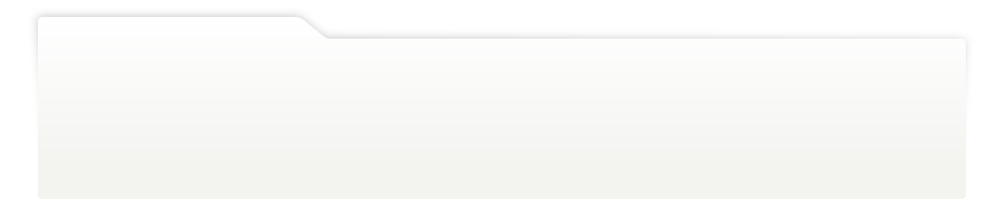
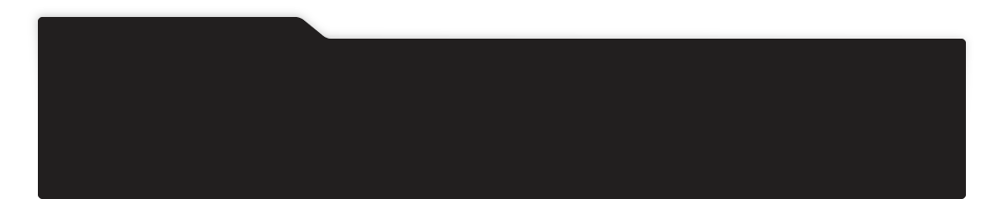
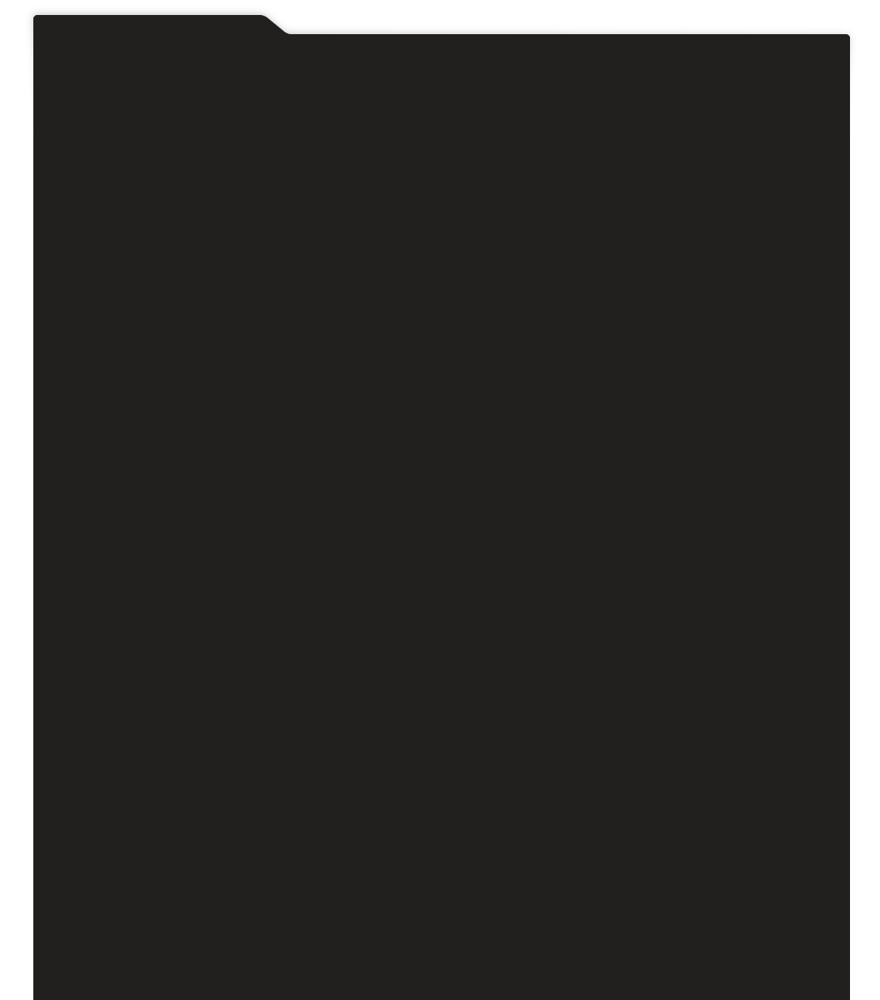
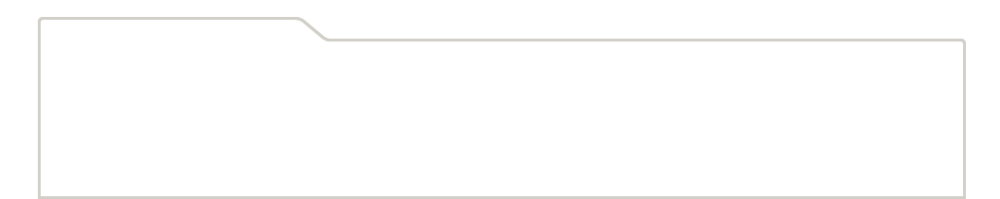
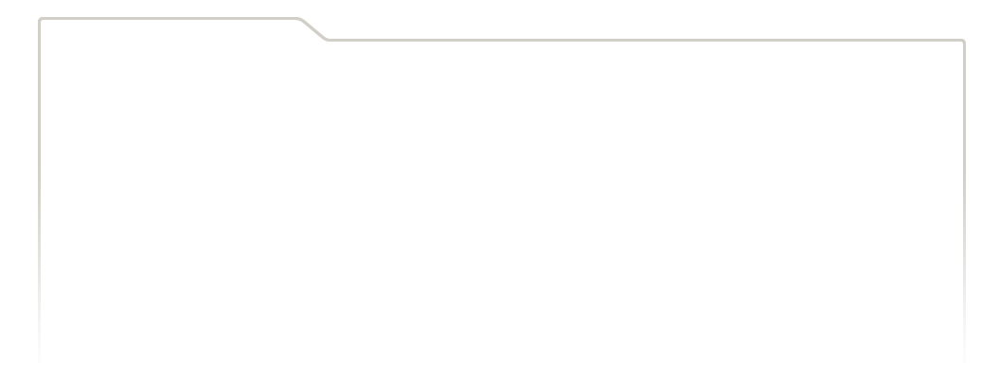
...
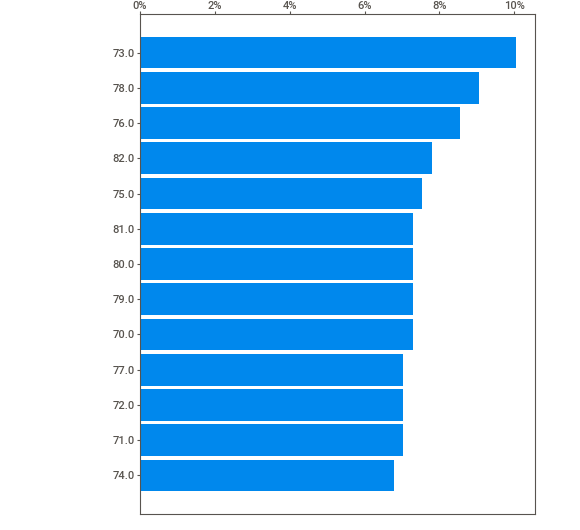
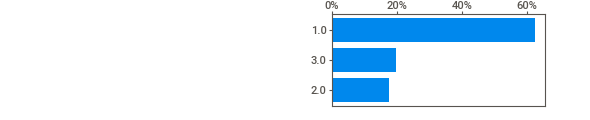
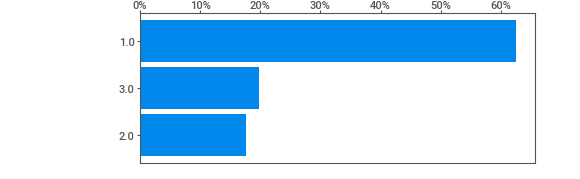
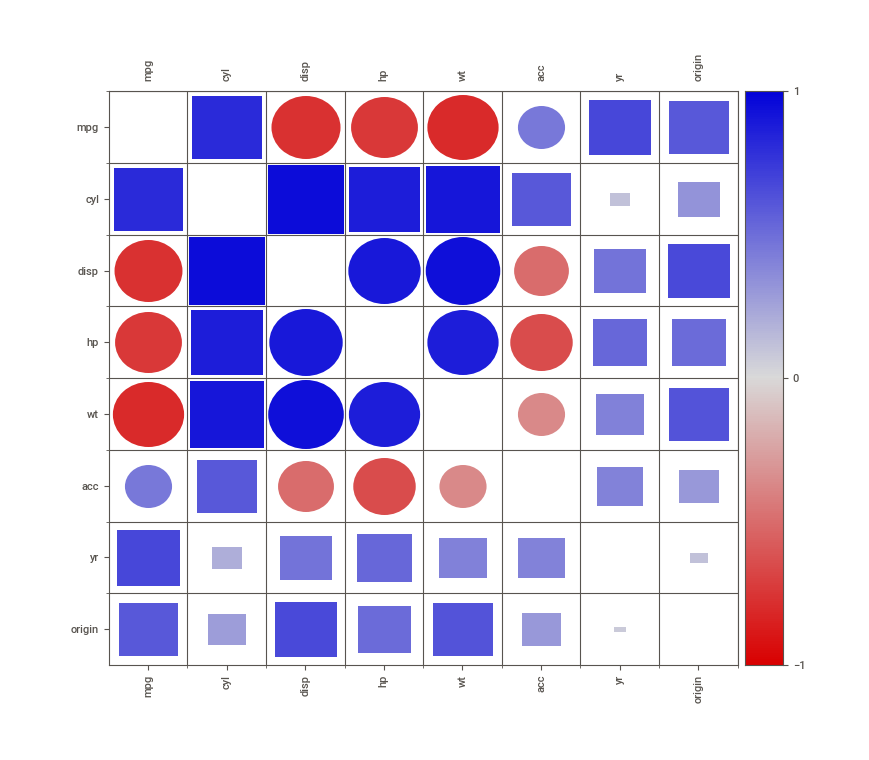
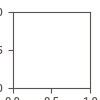

In [37]:
uni_report.show_notebook()

##### From the above above plots:
* We can infer that there are maximum number of 4 cylinder vehicles. Around 98% of the vehicles are either of 4, 6, 8 cylinders and only small percent of vehicles are either of 3 and 5 cylinders.
* Maximum number of vehicles are of the year 1973 and minumum number of the year 1974.
* Most of the vehicles are from origin region 1 as compared to the other two regions.
* We can infer that most of the vehicles have around 75-110 horsepower and only few vehicles have horsepoer above 200.
* i.e, horsepower seems significantly more skewed than the other features.
* There are outliers in hp, acc, mpg which need to be dealt with

######  Univariate plots

In [38]:
bi_report = sv.analyze(car_df, target_feat = 'mpg', pairwise_analysis = 'auto')


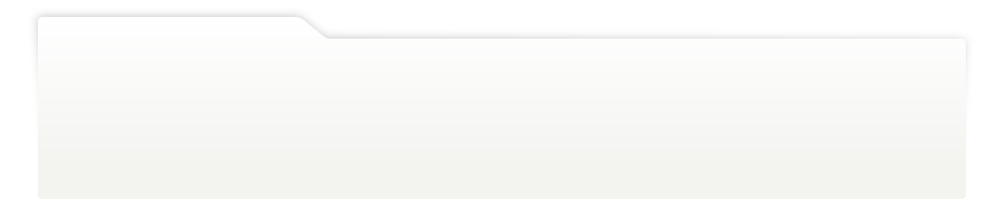
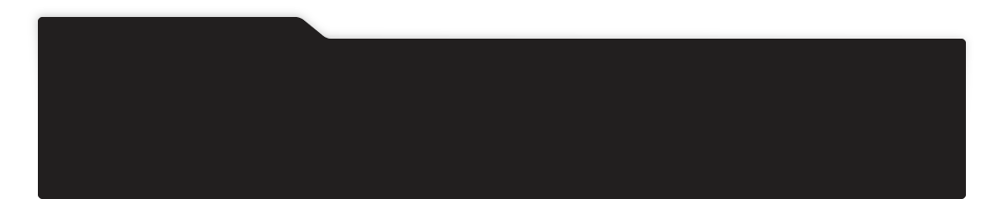
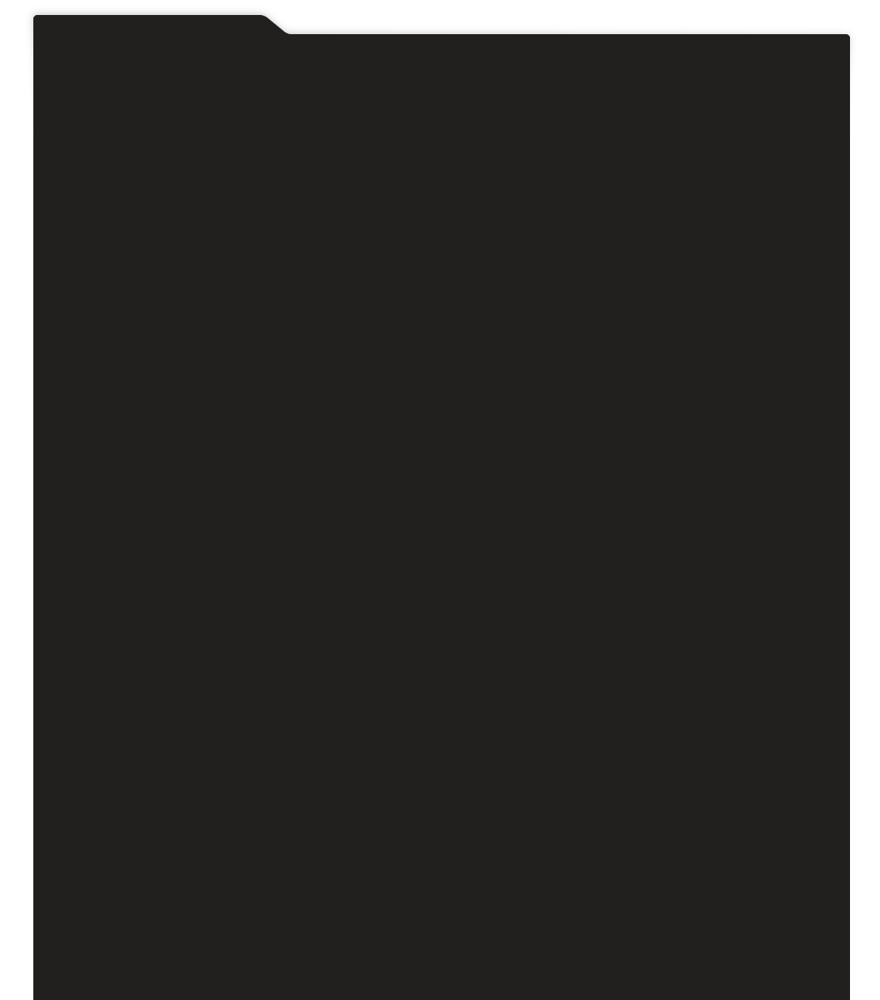
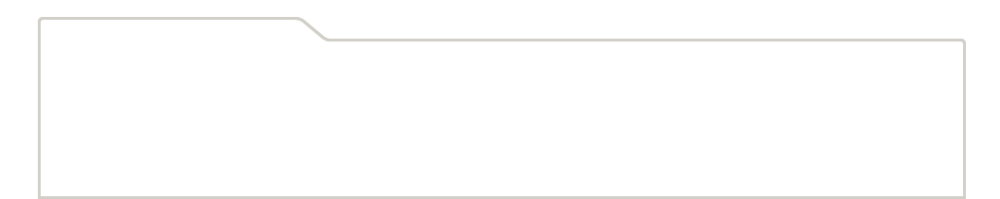
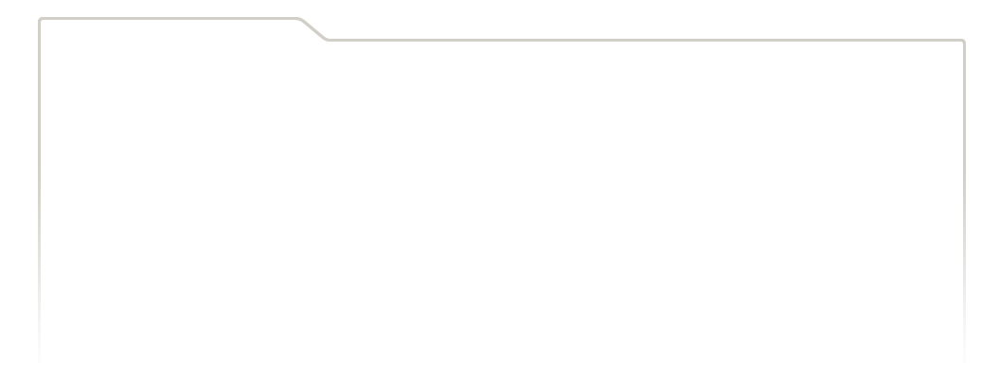
...
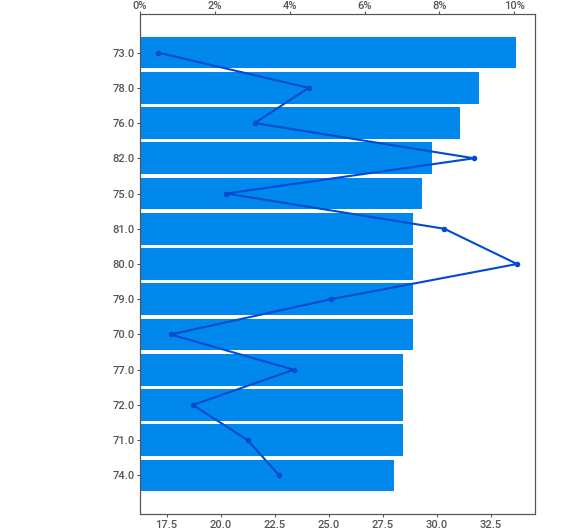
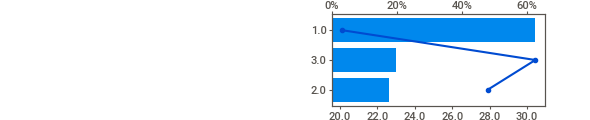
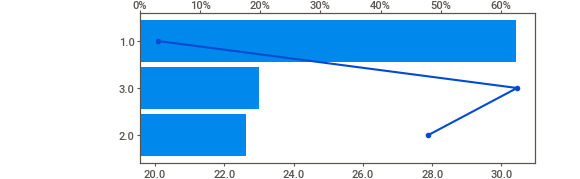
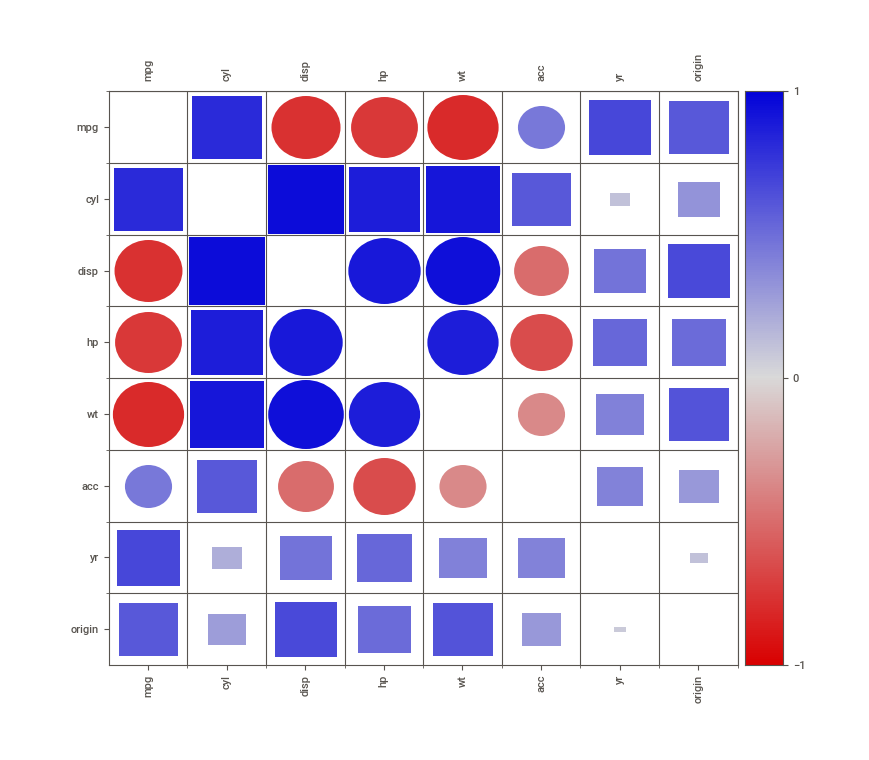
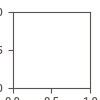

In [39]:
bi_report.show_notebook()

##### Multivariate plots

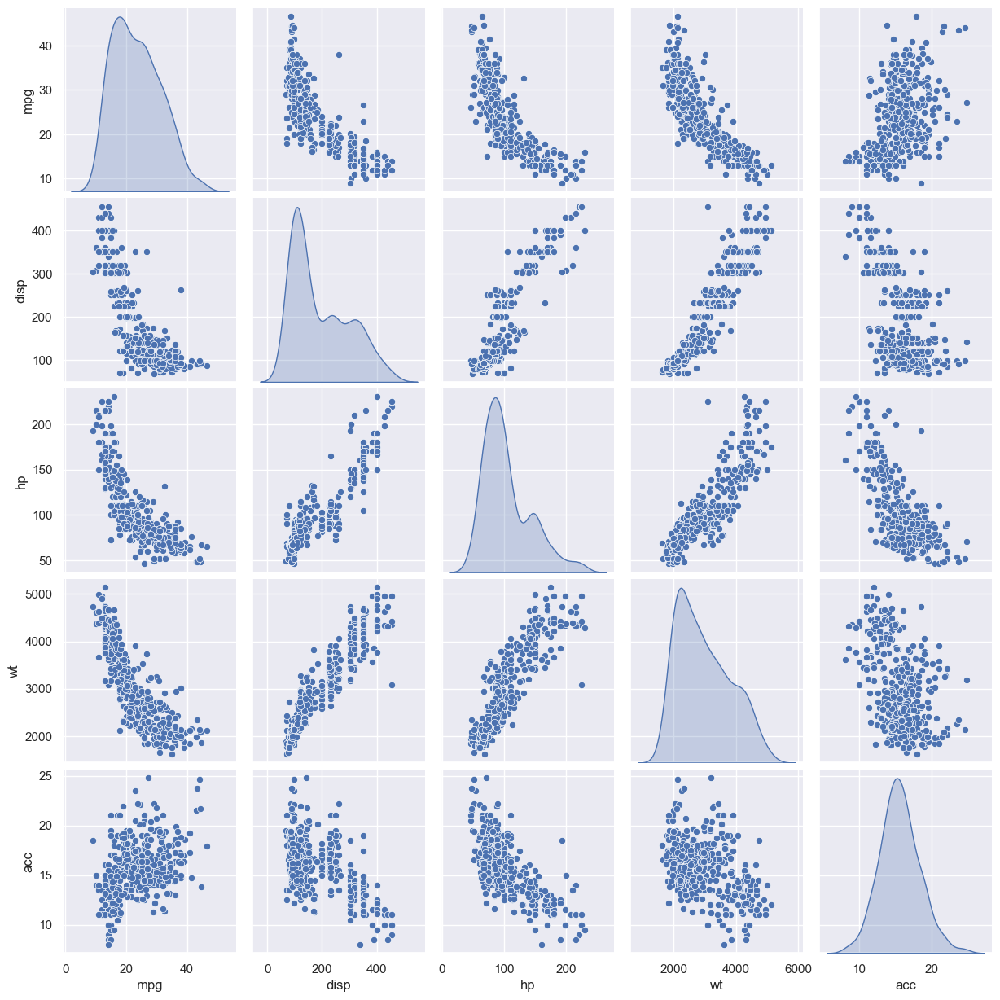

In [40]:
sns.set()
sns.set_style('darkgrid')
sns.pairplot(car_df, diag_kind = 'kde')
plt.show()

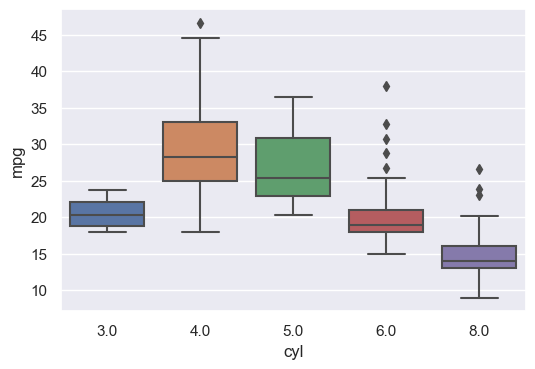

In [41]:
sns.set()
sns.set_style('darkgrid')
sns.boxplot(y='mpg', x='cyl',data=car_df)
plt.show()

* mpg is highest for 4 cylinder cars, But also note, there's high variance in mpg in the 4 cylinder cars
* mpg has a decreasing trend as the number of cylinders in the car increases 

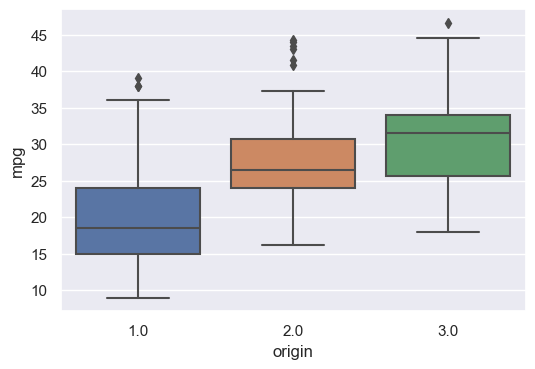

In [42]:
sns.set()
sns.set_style('darkgrid')
sns.boxplot(y='mpg', x='origin',data=car_df)
plt.show()

* Region 1 cars have the least efficient consumption.
* Region 3 cars do get the most out of their fuel and Region 2 cars rank 2nd.

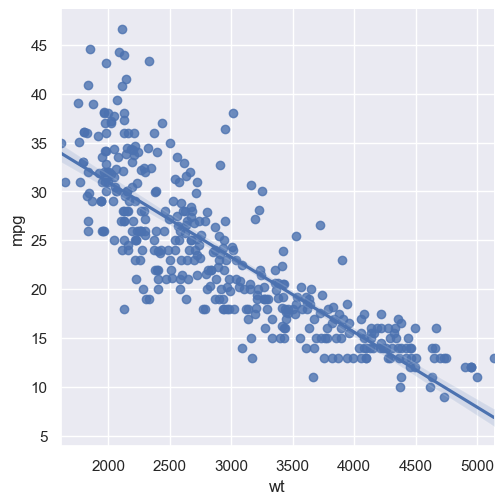

In [43]:
sns.set()
sns.set_style('darkgrid')
sns.lmplot(y='mpg', x='wt',data=car_df)
plt.show()

* we can infer a decreasing trend in mpy as wt of the car increases which makes sense given physics!

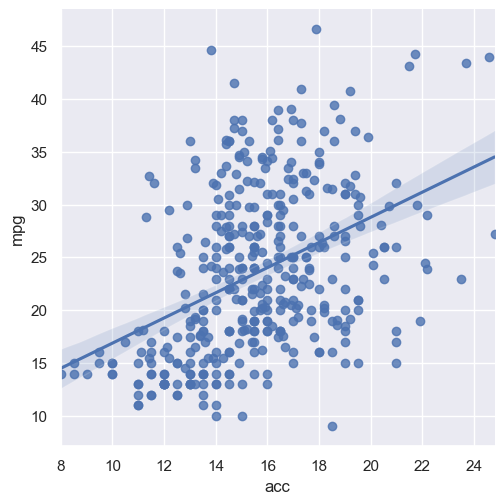

In [44]:
sns.set()
sns.set_style('darkgrid')
sns.lmplot(y='mpg', x='acc',data=car_df)
plt.show()

* There seems to be a slight increasing trend here, but we can't be sure given the high variance and the lesser number of data points we have

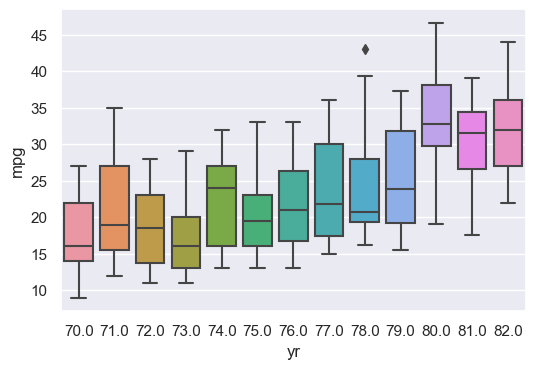

In [45]:
sns.boxplot(y='mpg',x='yr',data=car_df)
plt.show()

* With every year and with the newer models of the vehicles mileage per gallon (mpg) also increases.

### 4. Machine learning Modelling:
* Use K Means and Hierarchical clustering to find out the optimal number of clusters in the data.
* Share your insights about the difference in using these two methods. 

### Before modeling, we will do some data preprocessing: 
* scale our numerical features
* un-skew numerical features and especially mpg to be more normally distributed
* one hot encode true categoricals

In [46]:
df_numeric = car_df.select_dtypes(exclude=['category'])
df_obj = car_df.select_dtypes(include=['category']).copy()
df_numeric.columns

Index(['mpg', 'disp', 'hp', 'wt', 'acc'], dtype='object')

In [47]:
df_obj.columns

Index(['cyl', 'yr', 'origin'], dtype='object')

In [48]:
scaler = StandardScaler()

cols = []
for c in df_obj:
    dummies = pd.get_dummies(df_obj[c])
    dummies.columns = [c + "_" + str(x) for x in dummies.columns]
    cols.append(dummies)
df_obj = pd.concat(cols, axis=1)

pipe = make_pipeline(scaler)
scaled = pipe.fit_transform(df_numeric)
df_numeric = pd.DataFrame(scaled, columns=df_numeric.columns)

car_df_scaled = pd.concat([df_numeric, df_obj], axis=1)
car_df_scaled.reset_index(inplace=True, drop=True)

In [49]:
car_df_scaled.describe() # ready to fit

,mpg,disp,hp,wt,acc,cyl_3.0,cyl_4.0,cyl_5.0,cyl_6.0,cyl_8.0,...,yr_76.0,yr_77.0,yr_78.0,yr_79.0,yr_80.0,yr_81.0,yr_82.0,origin_1.0,origin_2.0,origin_3.0
count,3.980000e+02,3.980000e+02,3.980000e+02,3.980000e+02,3.980000e+02,398.000000,398.000000,398.000000,398.000000,398.000000,...,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000
mean,2.761610e-16,-8.312725e-17,-1.004222e-17,-9.902743e-17,8.982206e-17,0.010050,0.512563,0.007538,0.211055,0.258794,...,0.085427,0.070352,0.090452,0.072864,0.072864,0.072864,0.077889,0.625628,0.175879,0.198492
std,1.001259e+00,1.001259e+00,1.001259e+00,1.001259e+00,1.001259e+00,0.099871,0.500471,0.086601,0.408571,0.438523,...,0.279868,0.256061,0.287190,0.260241,0.260241,0.260241,0.268335,0.484569,0.381197,0.399367
min,-1.859374e+00,-1.204411e+00,-1.518067e+00,-1.604943e+00,-2.747814e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-7.704907e-01,-8.563178e-01,-7.609360e-01,-8.828266e-01,-6.328794e-01,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,-6.591883e-02,-4.314040e-01,-3.040464e-01,-1.973624e-01,-2.472221e-02,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
75%,7.027050e-01,6.584879e-01,5.444628e-01,7.538337e-01,5.834349e-01,0.000000,1.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
max,2.957335e+00,2.511784e+00,3.285800e+00,2.565185e+00,3.351912e+00,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### K Means

In [50]:
cluster_range = range(2, int(np.sqrt(car_df_scaled.shape[0]/2))) 
cluster_errors = []
for num_clusters in cluster_range:
    clusters = KMeans( num_clusters, n_init = 5)
    clusters.fit(car_df_scaled)
    labels = clusters.labels_
    centroids = clusters.cluster_centers_
    cluster_errors.append(clusters.inertia_)
clusters_df = pd.DataFrame( { "num_clusters":cluster_range, "cluster_errors": cluster_errors } )
clusters_df[0:15]

,num_clusters,cluster_errors
0,2,1531.973292
1,3,1144.681958
2,4,1018.575999
3,5,938.667414
4,6,877.377429
5,7,823.920778
6,8,782.300986
7,9,757.270234
8,10,724.490755
9,11,702.879948


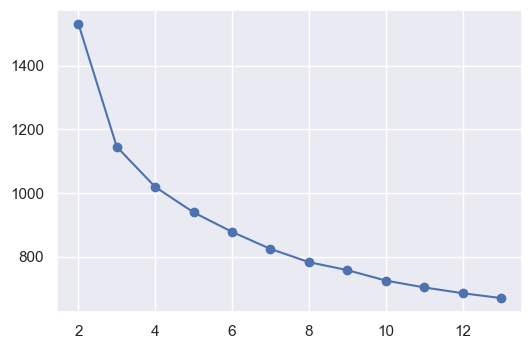

In [51]:
sns.set()
plt.plot(clusters_df.num_clusters, clusters_df.cluster_errors, marker = "o" )
plt.show()
# elbow plot

##### 5 seems to be a reasonable choice of number of clusters based on the above plot

In [52]:
k_means = KMeans(n_clusters = 5, random_state = 2354)
k_means.fit(car_df)

preds = k_means.predict(car_df)
car_df["GROUP"] = preds     # Creating a new column "GROUP" which will hold the cluster id of each record
car_df_scaled["GROUP"] = preds
car_df

,mpg,cyl,disp,hp,wt,acc,yr,origin,GROUP
0,18.0,8.0,307.0,130,3504,12.0,70.0,1.0,2
1,15.0,8.0,350.0,165,3693,11.5,70.0,1.0,3
2,18.0,8.0,318.0,150,3436,11.0,70.0,1.0,2
3,16.0,8.0,304.0,150,3433,12.0,70.0,1.0,2
4,17.0,8.0,302.0,140,3449,10.5,70.0,1.0,2
...,...,...,...,...,...,...,...,...,...
393,27.0,4.0,140.0,86,2790,15.6,82.0,1.0,4
394,44.0,4.0,97.0,52,2130,24.6,82.0,2.0,0
395,32.0,4.0,135.0,84,2295,11.6,82.0,1.0,0
396,28.0,4.0,120.0,79,2625,18.6,82.0,1.0,4


In [53]:
# Calculating silhouette_score
silhouette_score(car_df, k_means.labels_)

0.5517567355423867

In [54]:
# Check the number of data in each cluster

labels = k_means.labels_
counts = np.bincount(labels[labels>=0])
print(counts)
# Distribution looks fine.

[139  48  65  53  93]


In [55]:
# let us check the centers in each group
centroids = k_means.cluster_centers_
centroid_df = pd.DataFrame(centroids, columns = list(car_df.drop(['GROUP'], axis = 1)))
centroid_df.transpose()

,0,1,2,3,4
mpg,30.795683,13.602083,19.689231,16.030189,24.687097
cyl,3.978417,8.000000,6.230769,7.547170,4.612903
disp,98.046763,368.833333,238.707692,306.452830,149.387097
hp,72.820144,174.083333,106.369231,136.735849,94.741935
wt,2106.827338,4497.958333,3300.907692,3875.094340,2726.225806
acc,16.617986,12.791667,16.283077,14.330189,15.637634
yr,76.640288,73.104167,76.061538,74.981132,77.118280
origin,2.165468,1.000000,1.138462,1.018868,1.602151


# Observations:
* Group 4 has highest values for mpg while 3rd has lowest
* Group 1 has max no of cylinders
* Group 2 seems to be comprising of newest cars

### Hierarchical

In [56]:
X = car_df_scaled.iloc[:, :]
Z = linkage(X, 'ward', metric='euclidean') # create linkage
Z.shape

(397, 4)

In [57]:
Z

array([[2.34000000e+02, 2.36000000e+02, 1.83948848e-01, 2.00000000e+00],
       [6.80000000e+01, 6.90000000e+01, 1.90812281e-01, 2.00000000e+00],
       [1.29000000e+02, 1.45000000e+02, 2.15293611e-01, 2.00000000e+00],
       ...,
       [7.76000000e+02, 7.89000000e+02, 2.07265545e+01, 1.46000000e+02],
       [7.91000000e+02, 7.92000000e+02, 3.95359068e+01, 2.51000000e+02],
       [7.90000000e+02, 7.93000000e+02, 5.57784150e+01, 3.98000000e+02]])

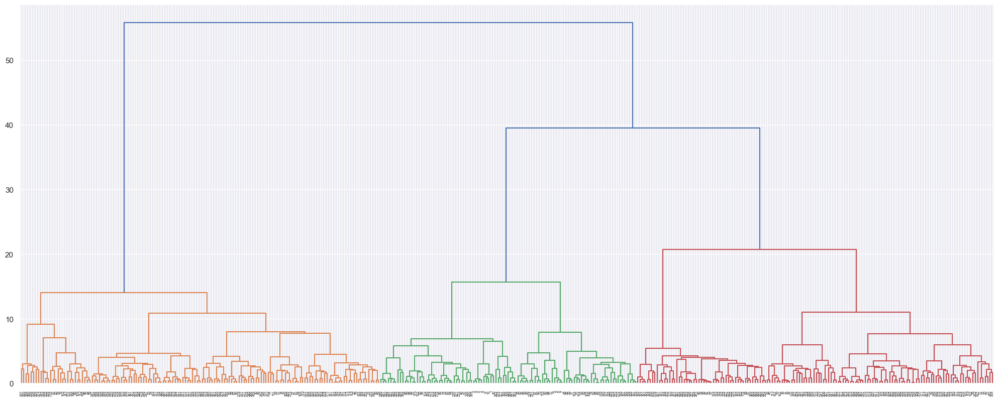

In [58]:
plt.figure(figsize=(25, 10))
dendrogram(Z)
plt.show()

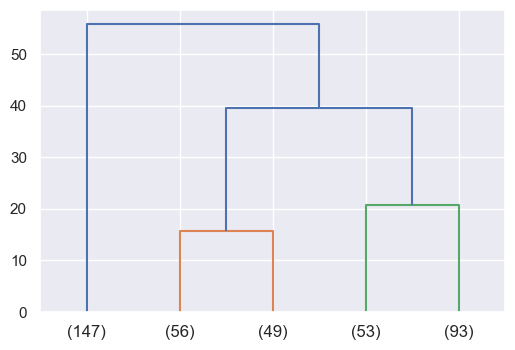

In [59]:
dendrogram(
    Z,
    truncate_mode='lastp',  # show only the last p merged clusters
    p = 5,  # show only the last p merged clusters
)
plt.show()

In [60]:
from scipy.cluster.hierarchy import fcluster
clusters = fcluster(Z, 5, criterion='maxclust')
clusters

array([2, 2, 2, 2, 2, 3, 3, 3, 3, 2, 2, 2, 2, 3, 1, 5, 5, 5, 1, 1, 5, 5,
       1, 1, 5, 3, 3, 3, 3, 1, 1, 1, 1, 5, 4, 4, 4, 4, 3, 3, 2, 2, 3, 3,
       3, 5, 1, 4, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 2, 2,
       2, 3, 3, 3, 3, 1, 2, 2, 3, 2, 5, 5, 5, 1, 1, 1, 5, 1, 1, 2, 2, 2,
       2, 2, 3, 3, 3, 3, 3, 3, 2, 4, 4, 5, 4, 5, 1, 3, 3, 3, 3, 5, 1, 1,
       1, 1, 1, 5, 1, 2, 3, 1, 1, 5, 5, 2, 5, 5, 2, 4, 5, 5, 4, 1, 5, 1,
       5, 4, 4, 4, 2, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 5, 1, 1, 4, 4,
       4, 4, 3, 3, 3, 3, 4, 4, 4, 4, 4, 2, 2, 1, 5, 5, 5, 5, 1, 5, 5, 1,
       4, 5, 5, 5, 5, 1, 5, 1, 5, 1, 1, 3, 3, 2, 3, 4, 4, 5, 4, 1, 1, 1,
       1, 4, 4, 4, 4, 1, 1, 1, 5, 4, 2, 1, 5, 4, 3, 2, 2, 2, 1, 1, 1, 1,
       1, 2, 2, 2, 3, 4, 4, 4, 4, 3, 2, 3, 3, 1, 5, 1, 5, 1, 1, 1, 1, 5,
       5, 5, 1, 1, 1, 1, 1, 2, 2, 2, 4, 4, 5, 5, 4, 4, 4, 4, 4, 4, 2, 2,
       2, 2, 1, 5, 1, 1, 5, 5, 5, 1, 5, 2, 5, 2, 1, 1, 4, 5, 5, 4, 4, 2,
       2, 2, 2, 3, 2, 2, 2, 1, 1, 1, 5, 1, 2, 1, 1,

In [61]:
car_df['clusters'] = clusters

In [62]:
car_df.clusters.value_counts() #

1    147
5     93
2     56
4     53
3     49
Name: clusters, dtype: int64

##### Seems like both clustering techniques found clusters with similar counts, which is primising
* K-Means:      [139  48  65  53  93]
* Hierarchical: [139, 93, 66. 58. 42]

In [63]:
aggdata=car_df.iloc[:,:].groupby('clusters').mean()
aggdata['Freq']=car_df.clusters.value_counts().sort_index()
aggdata

,mpg,disp,hp,wt,acc,GROUP,Freq
clusters,,,,,,,
1,30.529932,101.465986,73.176871,2169.619048,16.878912,0.108844,147
2,16.094643,315.607143,143.875000,3775.053571,13.053571,2.732143,56
3,13.610204,370.591837,175.122449,4469.142857,12.734694,1.020408,49
4,18.996226,232.867925,98.943396,3384.245283,17.086792,2.226415,53
5,24.687097,149.387097,94.741935,2726.225806,15.637634,4.000000,93


* Cluster 1: Most common cluster with highest mpg and good hp, low tw and good acc | Seems like newer cars
* Cluster 2: cluster with high disp, hp, somewhat bulky and good acc | Seems like muscle cars with lowre pgs
* Cluster 3: Cluster with leas mpg, highest disp, highest hp and higiestwt and good acc | Seems like american cars or trucks with more power and less mileage
* Cluster 4: Cluster with good mpg, and avg values for other variables and highest acc
* Cluster 5: Cluster withgood mpg,and avg value for other variables
#### Clusters 2, 3 and 4, 5  could be clubbed together and form three clusters for better targeting and sales

### Heirarchical
* Herarchical Clustering method construct a hierarchy of Clustering, not just a single partition of objects. 
* Hierarchical algorithm was adopted for categorical data, and due to its complexity a new approach for assigning rank value to each categorical attribute.
* It is less sensitive to noise in the dataset.
* The number of Clusters k is not required as an input.
* Hierarchical algorithm its performance is better.
* Hierarchical is good for smaller datasets.

### K-Means
*  K-Means Clustering generates a specific number of disjoint, flat (nonhierarchical) Clusters. 
*  The performance of K- mean algorithm is better than Hierarchical Clustering Algorithm.
*  K-Means can be used in categorical data is first converted into numeric by assigning rank.
*  K-Means is very sensitive to noise in the dataset.
*  k-Means algorithm is good for large dataset.

###  5. Observations based on outcomes of using ML based methods.
* Mention how many optimal clusters are present in the data and what could be the possible reason behind it.

#####  The optimal number of clusters from modeling perspective is subjective as the number of clusters is driven by business objective and the actual patterns in the data. So, from that perspective, there seem to be 3 distinct clusters with:
* older, low mpg cars
* high performace, sporty, low mpg cars
* modern, fuel effecient cars

#### Use linear regression model on different clusters separately and print the coefficients of the models individually

In [64]:
def plot_feature_importance(importance,names,model_type):
    """"Create arrays from feature importance and feature names"""
    feature_importance = np.array(importance)
    feature_names = np.array(names)

    #Create a DataFrame using a Dictionary
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)

    #Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

    #Define size of bar plot
    plt.figure(figsize=(10,8))
    #Plot Searborn bar chart
    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
    #Add chart labels
    plt.title(model_type)
    plt.xlabel('FEATURE IMPORTANCE')
    plt.ylabel('FEATURE NAMES')

Group: 0
Train Accuracy | Group 0: 0.845360824742268
Test Accuracy | Group 0: 0.7857142857142857
Group: 1
Train Accuracy | Group 1: 0.8484848484848485
Test Accuracy | Group 1: 0.7333333333333333
Group: 2
Train Accuracy | Group 2: 0.8888888888888888
Test Accuracy | Group 2: 0.75
Group: 3
Train Accuracy | Group 3: 0.8648648648648649
Test Accuracy | Group 3: 0.5625
Group: 4
Train Accuracy | Group 4: 0.8923076923076924
Test Accuracy | Group 4: 0.9642857142857143


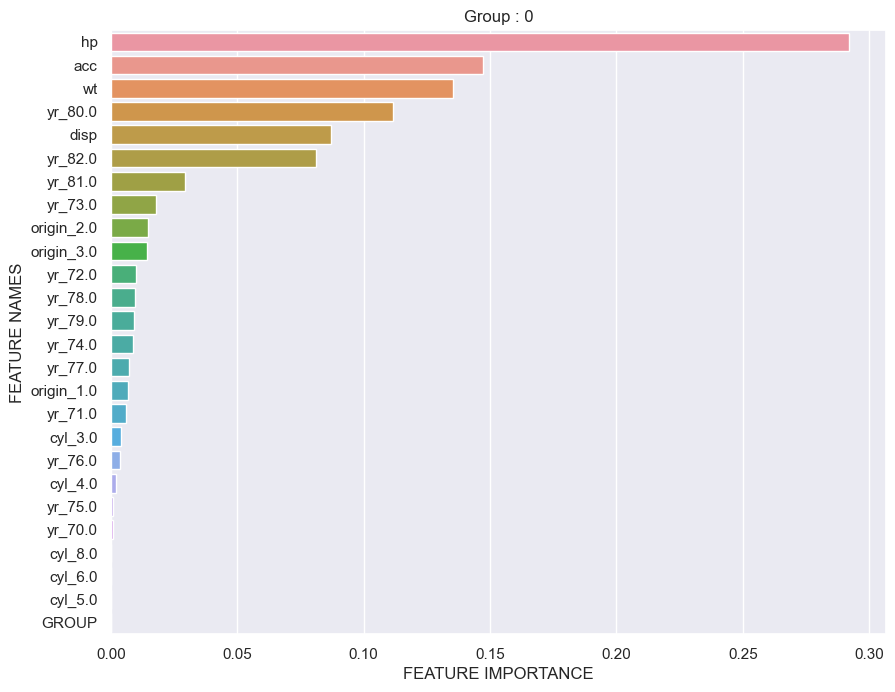

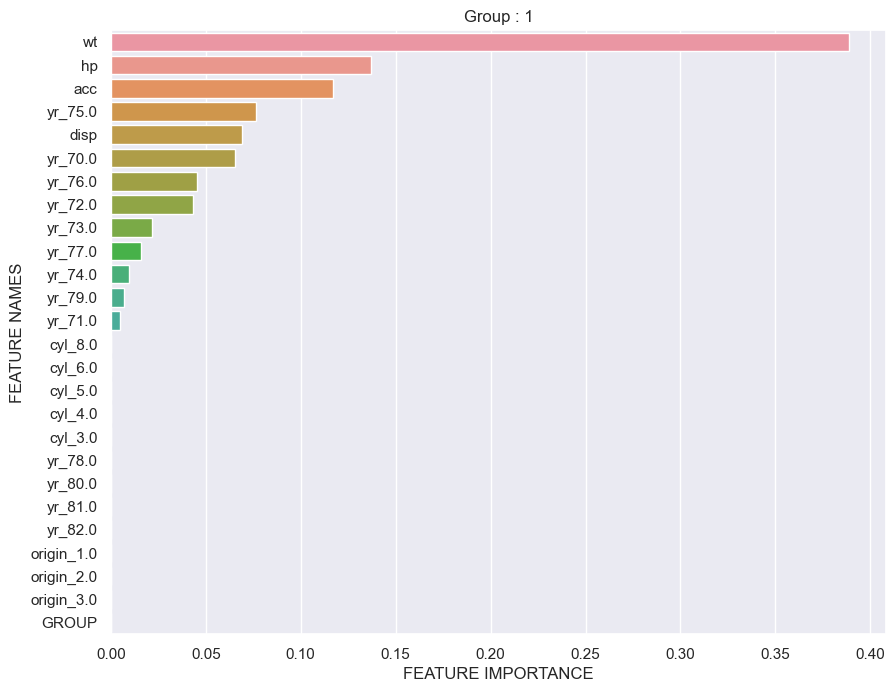

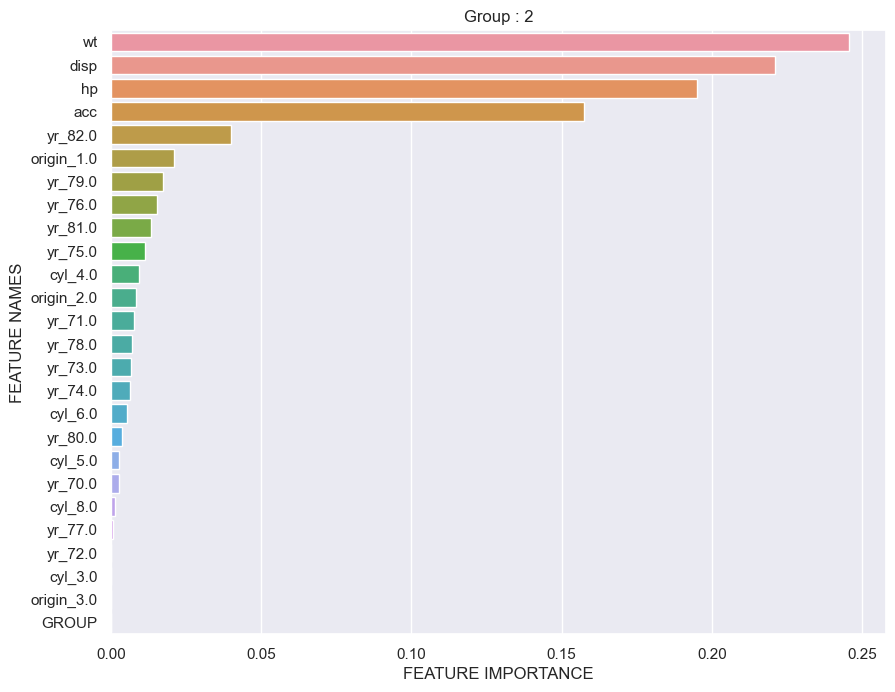

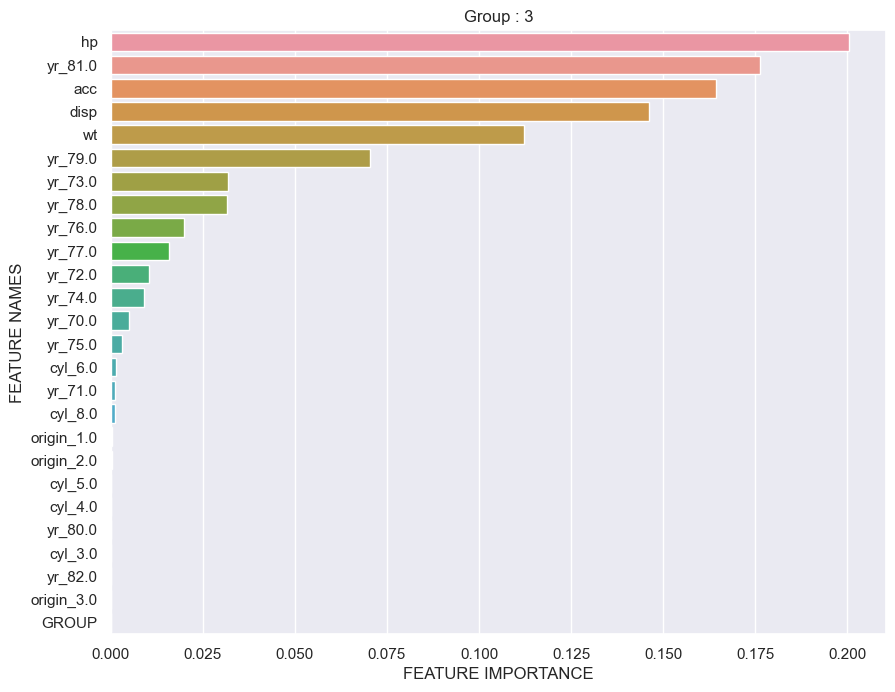

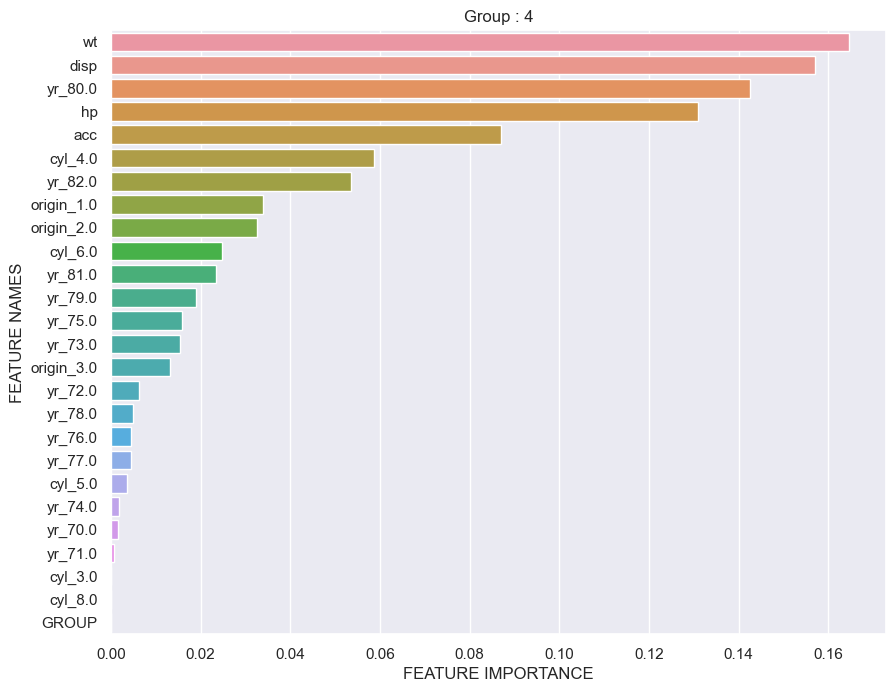

In [65]:
for group, group_df in car_df_scaled.groupby('GROUP'):
    lr = LinearRegression()
    rf = RandomForestRegressor()
    print(f'Group: {group}')
    y = group_df['mpg']
    X = group_df.drop('mpg', axis = 1)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3,  random_state = 200)
    lr.fit(X_train, y_train)
    ytr = np.array(y_train)
    ypr = lr.predict(X_train)
    train_acc = np.mean((ytr.astype(int) == ypr.astype(int)))
    ytr = np.array(y_test)
    ypr = lr.predict(X_test)
    xcols = list(X.columns)
    rf.fit(X, y)
    plot_feature_importance(rf.feature_importances_, xcols, f'Group : {group}')
    test_acc = np.mean((ytr.astype(int) == ypr.astype(int)))
    print(f'Train Accuracy | Group {group}: {train_acc}')
    print(f'Test Accuracy | Group {group}: {test_acc}')

In [66]:
lr = LinearRegression()
y = car_df_scaled['mpg']
X = car_df_scaled.drop(['mpg', 'GROUP'], axis = 1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3,  random_state = 200)
lr.fit(X_train, y_train)
ytr = np.array(y_train)
ypr = lr.predict(X_train)
train_acc = np.mean((ytr.astype(int) == ypr.astype(int)))
ytr = np.array(y_test)
ypr = lr.predict(X_test)
test_acc = np.mean((ytr.astype(int) == ypr.astype(int)))
print(f'Train Accuracy | Overall {group}: {train_acc}')
print(f'Test Accuracy | Overall {group}: {test_acc}')

Train Accuracy | Overall 4: 0.8345323741007195
Test Accuracy | Overall 4: 0.8083333333333333


### How using different models for different clusters will be helpful in this case and how it will be different than using one single model without clustering? Mention how it impacts performance and prediction.

##### As, we can clearly see, each cluster has widely different coefficients for the same variables when a linear model is fitted in the sub-dataset to predict mpg, This indicates that each cluster has different relationship between the target variable mpg and the predictive features. Hence, It is a must to train separate models for correct predictions each cluster to understand and intepret the predictions appropriately within each cluster. 
##### Also, the important features also have differed for each cluster to predict the mpg
##### Single model across all the clusters will fail to capture the differences between clusters and naively try to capture overall data feature to make predictions. Hence, this model will be underfit and suffer from low accuracy although latency for prediction would be better as the cluster need not be determined for a new data point before loading up the appropriate cluster model to make the final prediction.

### 6. Improvisation:
• Detailed suggestions or improvements or on quality, quantity, variety, velocity, veracity etc. on the data points collected by the company to
perform a better data analysis in future.

##### There has to be much more amount of data (very less number of data points used now) to be collected by the company if the analysis is to be applicable and useful in real life,
##### The data needs to be properly collected and vetted so that it is complete and no wrong or missing values occur
##### We would need some more data for each car like the car_type like electric, sport, luxury, muscle, or, green etc., to aid our analysis and improve clustering

# Part Two

* DOMAIN: Manufacturing
* CONTEXT: Company X curates and packages wine across various vineyards spread throughout the country.
* DATA DESCRIPTION: The data concerns the chemical composition of the wine and its respective quality.
* Attribute Information:
    1. A, B, C, D: specific chemical composition measure of the wine
    2. Quality: quality of wine [ Low and High ]
* PROJECT OBJECTIVE: Goal is to build a synthetic data generation model using the existing data provided by the company.
* Steps and tasks:
    1. Design a synthetic data generation model which can impute values [Attribute: Quality] wherever empty the company has missed recording the data.

In [67]:
company = pd.read_excel('Part2 - Company.xlsx')
company.shape

(61, 5)

In [68]:
company.T

,0,1,2,3,4,5,6,7,8,9,...,51,52,53,54,55,56,57,58,59,60
A,47,174,159,61,59,153,34,191,160,145,...,110,188,91,70,103,200,137,88,180,157
B,27,133,163,23,60,140,28,144,181,178,...,33,178,13,96,60,186,182,39,157,135
C,45,134,135,3,9,154,78,143,194,158,...,76,175,14,70,15,185,165,9,192,135
D,108,166,131,44,68,199,22,154,178,141,...,3,162,88,103,56,179,199,102,198,156
Quality,Quality A,Quality B,NaN,Quality A,Quality A,NaN,Quality A,NaN,Quality B,NaN,...,Quality A,NaN,Quality A,Quality A,Quality A,Quality B,NaN,NaN,NaN,NaN


In [69]:
company.Quality.value_counts()

Quality A    26
Quality B    17
Name: Quality, dtype: int64

In [70]:
company.Quality = company.Quality.replace({"Quality A": 0, "Quality B": 1})

In [71]:
company.Quality.value_counts()

0.0    26
1.0    17
Name: Quality, dtype: int64

In [72]:
company.isna().sum()

A           0
B           0
C           0
D           0
Quality    18
dtype: int64

##### We have 18 missing entries for Quality model. So, we can train a model that does clustering on the dataset so that based on the clusters information the Quality of the missing values can be imputed or filled in by the company

In [73]:
train_df = company.dropna()
train_df.isna().sum() # no missing values in training data

A          0
B          0
C          0
D          0
Quality    0
dtype: int64

In [74]:
train_df.dtypes

A            int64
B            int64
C            int64
D            int64
Quality    float64
dtype: object

In [75]:
train_df.Quality.value_counts()

0.0    26
1.0    17
Name: Quality, dtype: int64

In [76]:
X = train_df.drop(['Quality'], axis = 1)

In [77]:
y = train_df.Quality

In [78]:
train_df.shape

(43, 5)

In [79]:
# scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
# X_scaled

In [80]:
y = LabelEncoder().fit_transform(y)
y = y.reshape((y.shape[0], 1))
y.shape

(43, 1)

In [81]:
X = np.concatenate([X_scaled, y], axis = 1)

For no. of clusters = 2 , the average silhouette_score is : 0.6813272732223843


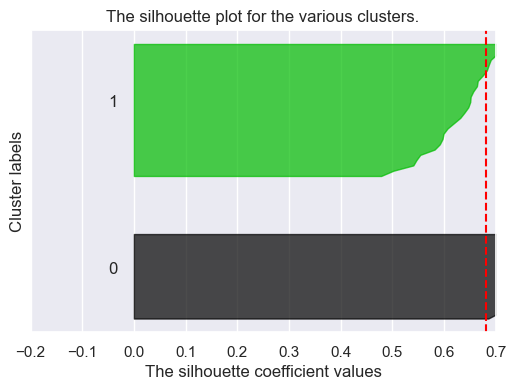

For no. of clusters = 3 , the average silhouette_score is : 0.40716073948642717


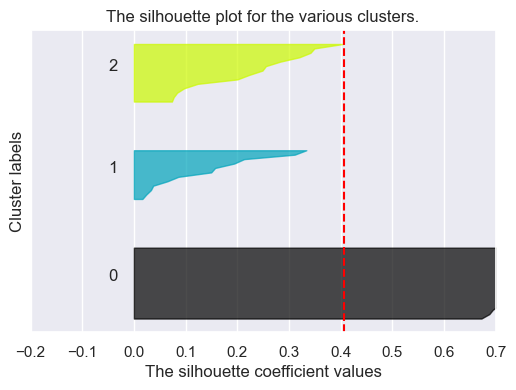

In [82]:
#Let's try using K-means clustering which is most widely used Unsupervised model to see if there are any clusters

#Importing KMeans submodule from cluster module in sklearn library
from sklearn.cluster import KMeans

#Importing metrics module from sklearn library
from sklearn import metrics

#Importing cm module from matplotlib library for ColorMaps
import matplotlib.cm as cm

#Assigning a dummy arrays Cluster_error & cluster_sil_scores
Cluster_error = []
cluster_sil_scores = []

#Defining cluster range from 1 to 10 though the minimum clusters we should find is 3 as it will help visualize Elbow plot
cluster_range = range(1, 4)

#Fit model KMeans for each value of cluster in the range defined in cluster_range
for num_clusters in cluster_range:
    clusters = KMeans(num_clusters, random_state = 5)
    clusters.fit(X)
    Cluster_error.append(clusters.inertia_)
    labels = clusters.labels_

    #Since, 
    if num_clusters == 1:
        cluster_sil_scores.append(np.NaN)
        continue
        
    cluster_sil_scores.append(metrics.silhouette_score(X, labels, metric='euclidean'))

    #The silhouette_score gives the average value for all the samples.
    #This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = metrics.silhouette_score(X, labels)
    print("For no. of clusters =", num_clusters, ", the average silhouette_score is :", silhouette_avg)

    #Compute the silhouette scores for each sample
    sample_silhouette_values = metrics.silhouette_samples(X, labels)
    
    y_lower = 10
    for i in range(num_clusters):
        #Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / num_clusters)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        #Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        #Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples
    
    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster labels")
    plt.yticks([])
    plt.xlim([-0.2, 0.7])

    #The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    #Show the plot for each number of clusters
    plt.show()

In [83]:
cluster_range = range(2, int(np.sqrt(X.shape[0]/2))) 
cluster_errors = []
for num_clusters in cluster_range:
    clusters = KMeans(num_clusters, n_init = 5)
    clusters.fit(X)
    labels = clusters.labels_
    centroids = clusters.cluster_centers_
    cluster_errors.append(clusters.inertia_)
clusters_df = pd.DataFrame( { "num_clusters":cluster_range, "cluster_errors": cluster_errors } )
clusters_df[0:15]

,num_clusters,cluster_errors
0,2,36.004309
1,3,28.887358


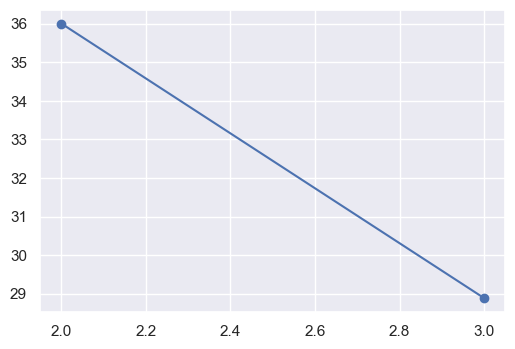

In [84]:
sns.set()
plt.plot(clusters_df.num_clusters, clusters_df.cluster_errors, marker = "o" )
plt.show()
# elbow plot

In [85]:
# Going with n_clusters = 2 as silhouette scores is higher
k_means = KMeans(2, random_state = 5)
k_means.fit(X)

KMeans(n_clusters=2, random_state=5)

In [116]:
train_df['prediction'] = pd.Series(k_means.labels_)

<ipython-input-116-503917c06e06>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['prediction'] = pd.Series(k_means.labels_)


In [87]:
train_df

,A,B,C,D,Quality,prediction
0,47,27,45,108,0.0,1.0
1,174,133,134,166,1.0,0.0
3,61,23,3,44,0.0,1.0
4,59,60,9,68,0.0,1.0
6,34,28,78,22,0.0,1.0
8,160,181,194,178,1.0,1.0
10,76,94,107,37,0.0,0.0
11,138,200,153,192,1.0,1.0
12,27,106,57,37,0.0,1.0
13,45,76,56,57,0.0,0.0


In [88]:
train_df.dropna(inplace = True)

<ipython-input-88-2749765fd5db>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df.dropna(inplace = True)


In [89]:
train_df.Quality.value_counts()

0.0    18
1.0    13
Name: Quality, dtype: int64

In [90]:
train_df.prediction.value_counts()

1.0    19
0.0    12
Name: prediction, dtype: int64

In [91]:
np.mean(train_df.Quality == train_df.prediction)

0.4838709677419355

####  Hence, we are able to make 48% accurate quality classification just based on the two clusters

# Part Three

* DOMAIN: Automobile
* CONTEXT: The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette.
The vehicle may be viewed from one of many different angles.
* DATA DESCRIPTION: The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to distinguish between the cars.
* All the features are numeric i.e. geometric features extracted from the silhouette.
* PROJECT OBJECTIVE: Apply dimensionality reduction technique – PCA and train a model using principal components instead of training the model using just the raw data.


### 1. Data: Import, clean and pre-process the dat

In [92]:
vehicle = pd.read_csv('Part3 - vehicle.csv')
vehicle

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
841,93,39.0,87.0,183.0,64.0,8,169.0,40.0,20.0,134,200.0,422.0,149.0,72.0,7.0,25.0,188.0,195,car
842,89,46.0,84.0,163.0,66.0,11,159.0,43.0,20.0,159,173.0,368.0,176.0,72.0,1.0,20.0,186.0,197,van
843,106,54.0,101.0,222.0,67.0,12,222.0,30.0,25.0,173,228.0,721.0,200.0,70.0,3.0,4.0,187.0,201,car
844,86,36.0,78.0,146.0,58.0,7,135.0,50.0,18.0,124,155.0,270.0,148.0,66.0,0.0,25.0,190.0,195,car


In [93]:
vehicle.dtypes

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object

In [94]:
vehicle.isna().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [95]:
vehicle.dropna(inplace = True, axis = 0) # remove missing values
vehicle.isna().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

In [96]:
vehicle['class'] = LabelEncoder().fit_transform(vehicle['class'])

In [ ]:
pandas_profiling.ProfileReport(vehicle)

### 2. EDA and visualisation: Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden patterns by using all possible methods.



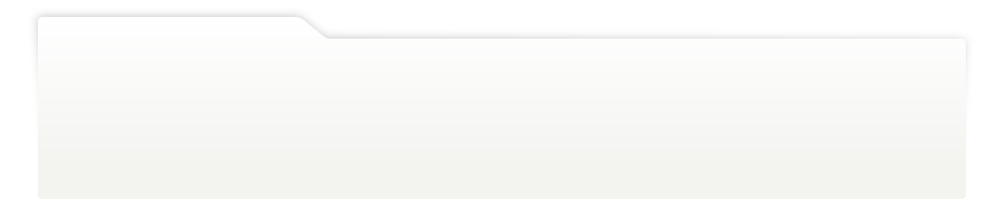
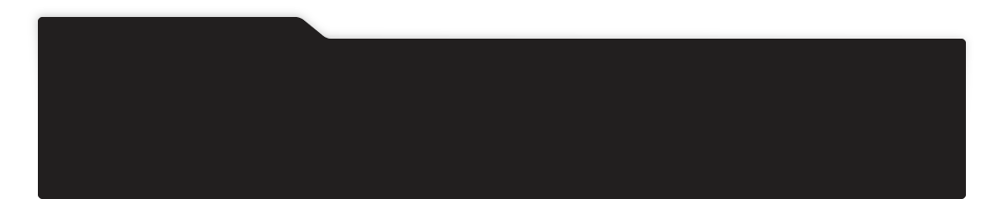
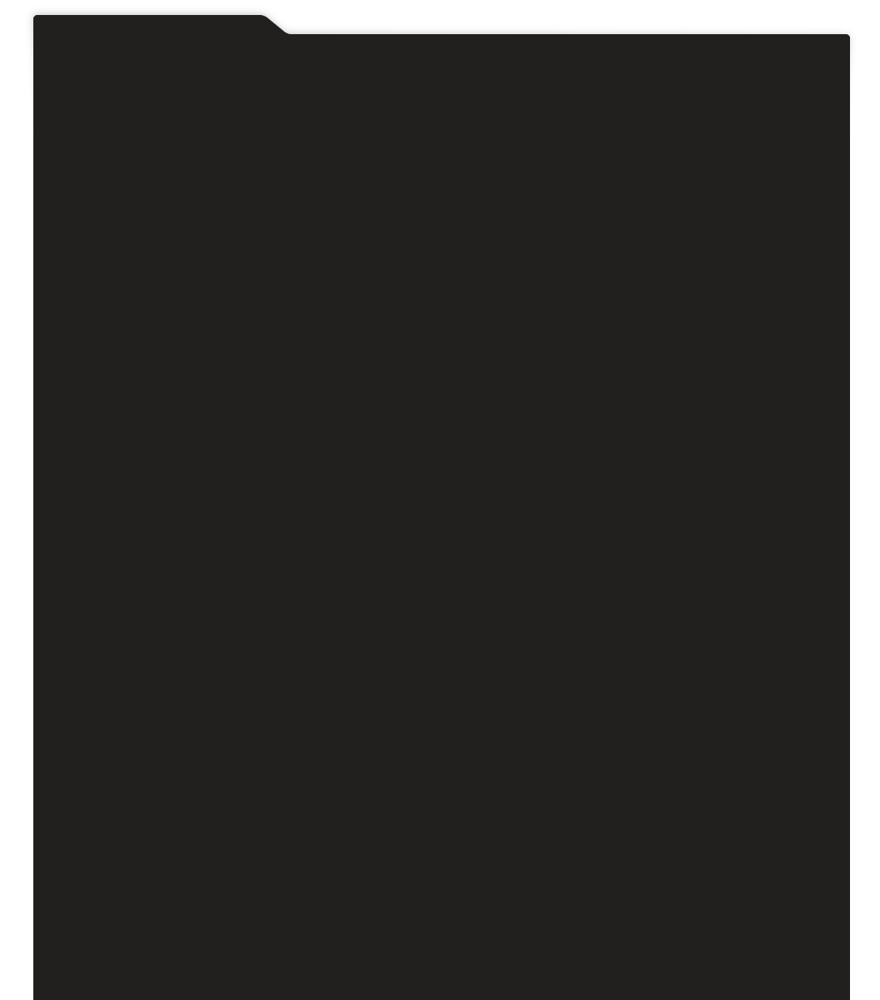
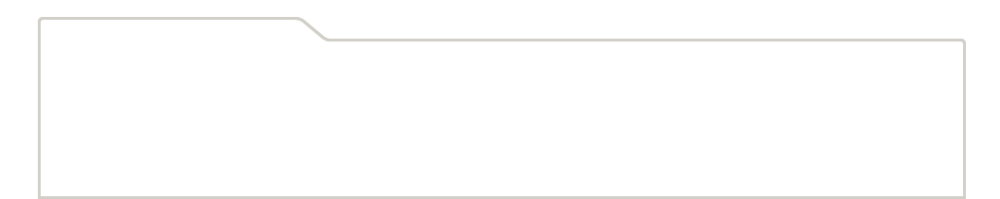
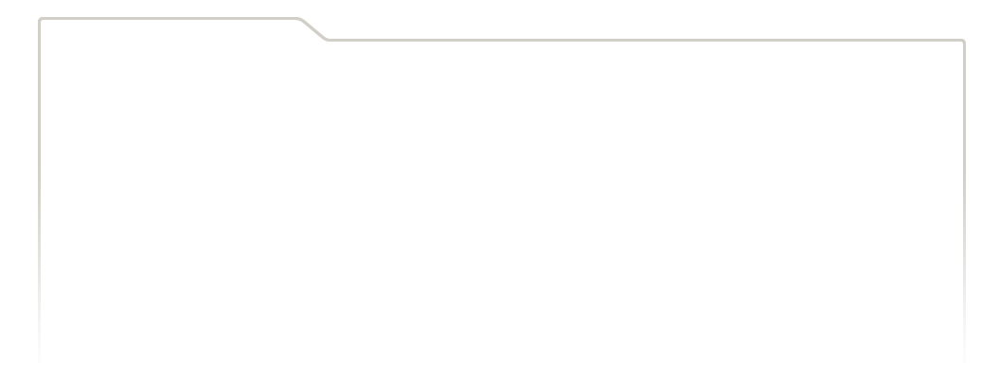
...
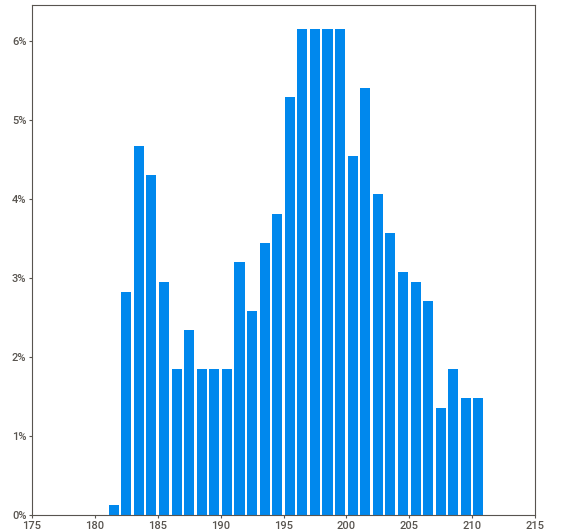
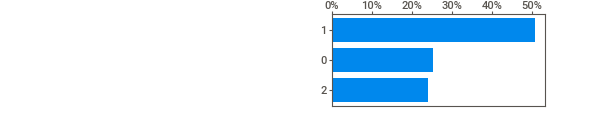
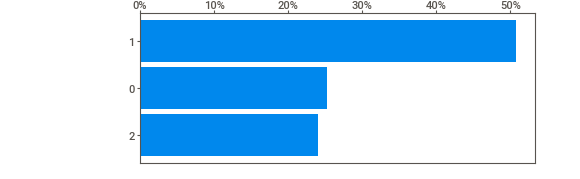
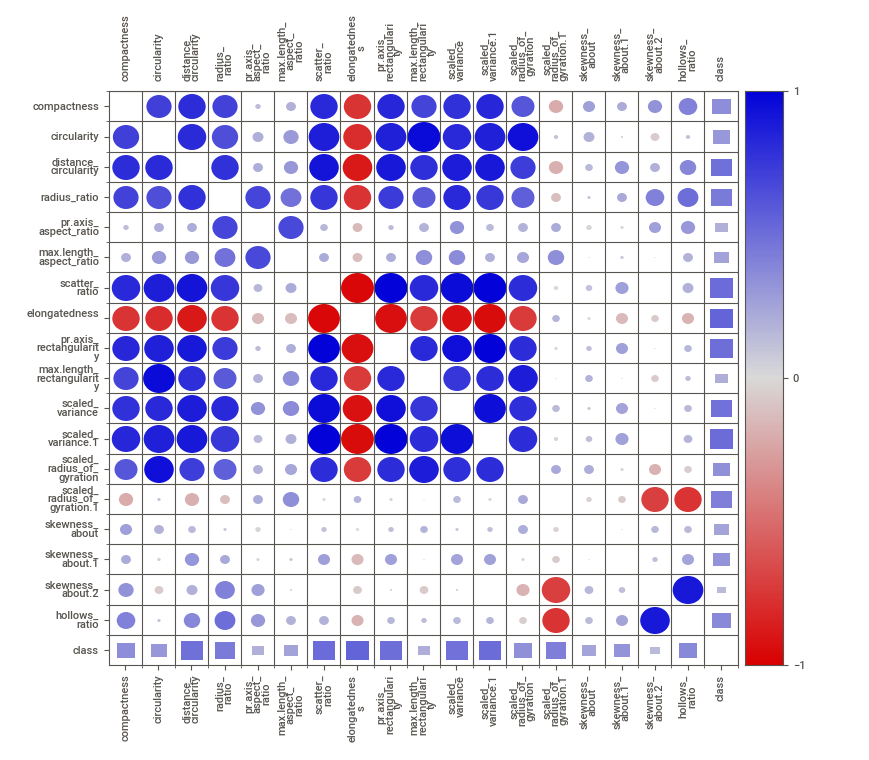
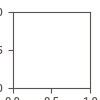

In [117]:
sv.analyze(vehicle).show_notebook()

#### From the associations tab, the correlation heatmpa shows that multiple variables are highly correlated to each other, Hence, PCA maybe beneficial here

In [118]:
# utility funciton
def plot_confusion_matrix(y_true, y_pred, ax, class_names  = ['Positive', 'Negative'], vmax=None,
                           normalized=True, title='Confusion matrix'):
    """
    Helper fuction to generate a clean Confusion Matrix using seaborn library.
    y_true: True labels, y_pred: Model Predictions, class_names: Override if needed
    normalized: True, gives the proportions instead of absolute numbers
    """
    matrix = confusion_matrix(y_true,y_pred)
    if normalized:
        matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]
    annot_kws = {'fontsize':25, 
                'fontstyle': 'italic'}
    sns.heatmap(matrix, vmax=vmax, annot=True,  annot_kws = annot_kws,
                square=True, ax=ax, cbar=False,
                cmap=sns.diverging_palette(10, 200, as_cmap=True), 
                linecolor='black', linewidths=0.5,
                xticklabels=class_names)
    ax.set_title(title, y=1.20, fontsize=16)
    ax.set_ylabel('True labels', fontsize=12)
    ax.set_xlabel('Predicted labels', y=1.10, fontsize=12)
    ax.set_yticklabels(class_names, rotation=0)

### 3. Classifier: Design and train a best fit SVM classier using all the data attributes.

In [119]:
vehicle.T

,0,1,2,3,4,6,7,8,10,11,...,836,837,838,839,840,841,842,843,844,845
compactness,95.0,91.0,104.0,93.0,85.0,97.0,90.0,86.0,86.0,90.0,...,87.0,94.0,95.0,90.0,93.0,93.0,89.0,106.0,86.0,85.0
circularity,48.0,41.0,50.0,41.0,44.0,43.0,43.0,34.0,36.0,34.0,...,45.0,46.0,43.0,44.0,34.0,39.0,46.0,54.0,36.0,36.0
distance_circularity,83.0,84.0,106.0,82.0,70.0,73.0,66.0,62.0,70.0,66.0,...,66.0,77.0,76.0,72.0,66.0,87.0,84.0,101.0,78.0,66.0
radius_ratio,178.0,141.0,209.0,159.0,205.0,173.0,157.0,140.0,143.0,136.0,...,139.0,169.0,142.0,157.0,140.0,183.0,163.0,222.0,146.0,123.0
pr.axis_aspect_ratio,72.0,57.0,66.0,63.0,103.0,65.0,65.0,61.0,61.0,55.0,...,58.0,60.0,57.0,64.0,56.0,64.0,66.0,67.0,58.0,55.0
max.length_aspect_ratio,10.0,9.0,10.0,9.0,52.0,6.0,9.0,7.0,9.0,6.0,...,8.0,8.0,10.0,8.0,7.0,8.0,11.0,12.0,7.0,5.0
scatter_ratio,162.0,149.0,207.0,144.0,149.0,153.0,137.0,122.0,133.0,123.0,...,140.0,158.0,151.0,137.0,130.0,169.0,159.0,222.0,135.0,120.0
elongatedness,42.0,45.0,32.0,46.0,45.0,42.0,48.0,54.0,50.0,54.0,...,47.0,42.0,44.0,48.0,51.0,40.0,43.0,30.0,50.0,56.0
pr.axis_rectangularity,20.0,19.0,23.0,19.0,19.0,19.0,18.0,17.0,18.0,17.0,...,18.0,20.0,19.0,18.0,18.0,20.0,20.0,25.0,18.0,17.0
max.length_rectangularity,159.0,143.0,158.0,143.0,144.0,143.0,146.0,127.0,130.0,118.0,...,148.0,148.0,149.0,144.0,120.0,134.0,159.0,173.0,124.0,128.0


In [120]:
X = vehicle.drop(['class'], axis = 1)
y = vehicle['class']

In [121]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=778)
X_train.shape, X_test.shape

((569, 18), (244, 18))

In [122]:
# hyper paramter tuning
parameters = {'C':[1,10,100],'gamma':[1,0.1,0.001], 'kernel':['linear','rbf']}
clf = GridSearchCV(SVC(), parameters, cv=6, verbose=5, n_jobs=-1)

In [123]:
clf.fit(X_train, y_train)

Fitting 6 folds for each of 18 candidates, totalling 108 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done  99 out of 108 | elapsed:    5.6s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done 108 out of 108 | elapsed:    6.1s finished


GridSearchCV(cv=6, estimator=SVC(), n_jobs=-1,
             param_grid={'C': [1, 10, 100], 'gamma': [1, 0.1, 0.001],
                         'kernel': ['linear', 'rbf']},
             verbose=5)

In [124]:
clf.best_params_

{'C': 1, 'gamma': 1, 'kernel': 'linear'}

In [125]:
svc = SVC(C = 1, gamma = 1, kernel = 'linear', probability = False, random_state = 778)
svc.fit(X_train, y_train)

SVC(C=1, gamma=1, kernel='linear', random_state=778)

In [126]:
accuracy_score(y_train, svc.predict(X_train)) # train acc

0.9912126537785588

In [127]:
svc_pred = svc.predict(X_test)
svc_acc = accuracy_score(y_test, svc_pred)
svc_acc # best test accuracy without PCA for SVC

0.9385245901639344

ValueError: The number of FixedLocator locations (3), usually from a call to set_ticks, does not match the number of ticklabels (2).

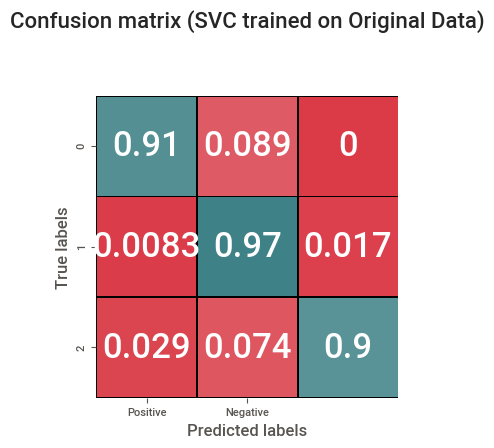

In [128]:
fig, axis1 = plt.subplots(nrows=1, ncols=1)
plot_confusion_matrix(y_test, svc_pred,  ax=axis1, title='Confusion matrix (SVC trained on Original Data)')

### 4. Dimensional reduction: perform dimensional reduction on the data.

In [ ]:
pca = PCA(n_components=7)
vehicle_components = pca.fit_transform(X)

In [ ]:
vehicle_components.shape

In [ ]:
principal_df = pd.DataFrame(data = vehicle_components , columns = [f'principal component {i}' for i in range(7)])
principal_df.tail()
print('Explained variation per principal component: \n{}'.format(pca.explained_variance_ratio_))

##### Let's use 3 principal components as the rest of the component add only very negligible amounts of variance explained

In [ ]:
pca = PCA(n_components=1)
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test) # do not fit on test to avoid data leakage
X_train.shape, X_test.shape

### 5. Classifier: Design and train a best fit SVM classier using dimensionally reduced attributes.

In [ ]:
# hyper paramter tuning
parameters = {'C':[1,10,100],'gamma':[1,0.1,0.001], 'kernel':['linear','rbf']}
clf = GridSearchCV(SVC(), parameters, cv=6, verbose=5, n_jobs=-1)

In [ ]:
clf.fit(X_train, y_train)

In [ ]:
clf.best_params_

In [ ]:
svc = SVC(C = 1, gamma = 0.001, kernel = 'rbf', probability = False, random_state = 778)
svc.fit(X_train, y_train)

In [ ]:
accuracy_score(y_train, svc.predict(X_train)) # train acc

In [ ]:
svc_pred = svc.predict(X_test)
svc_acc = accuracy_score(y_test, svc_pred)
svc_acc # best accuracy with PCA for SVC

In [ ]:
fig, axis1 = plt.subplots(nrows=1, ncols=1)
plot_confusion_matrix(y_test, svc_pred,  ax=axis1, title='Confusion matrix (SVC trained on Principal Components)')

### 6. Conclusion: Showcase key pointer on how dimensional reduction helped in this case

#### Summary:
* Test set accuracy for model trained on data with all fetures is 93.8%.
* Test set accuracy for model trai3end on data with only 3 principal components after dimensionality reduction is applied is
* Hence, 
* Only downside is that after transforming the data using PCA, we lose explainability of the model & using KMeans Clustering algorithm on top of it, we would not be able to explain how the model has dropped a dimension & then formed clusters on that transformed data.
* But, if our objective is to get better accuracy over explainability, we can surely use this approach as we can see that it is giving us wonderful results & we can be highly confident of model perfomrnace in Production environment to use Qualitative Parameters of unknown case to predict Bankruptcy.

# Part Four

* DOMAIN: Sports management
* CONTEXT: Company X is a sports management company for international cricket.
* DATA DESCRIPTION: The data is collected belongs to batsman from IPL series conducted so far. Attribute Information:
    1. Runs: Runs score by the batsman
    2. Ave: Average runs scored by the batsman per match
    3. SR: strike rate of the batsman
    4. Fours: number of boundary/four scored
    5. Six: number of boundary/six scored
    6. HF: number of half centuries scored so far
* PROJECT OBJECTIVE: Goal is to build a data driven batsman ranking model for the sports management company to make business decisions.

### 1. EDA and visualisation: Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden patterns by using all possible methods.


In [134]:
ipl = pd.read_csv('Part4 - batting_bowling_ipl_bat.csv')
ipl.shape

(180, 7)

In [135]:
ipl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Name    90 non-null     object 
 1   Runs    90 non-null     float64
 2   Ave     90 non-null     float64
 3   SR      90 non-null     float64
 4   Fours   90 non-null     float64
 5   Sixes   90 non-null     float64
 6   HF      90 non-null     float64
dtypes: float64(6), object(1)
memory usage: 10.0+ KB


In [136]:
ipl.isna().sum() # many rows with missing values

Name     90
Runs     90
Ave      90
SR       90
Fours    90
Sixes    90
HF       90
dtype: int64

In [137]:
ipl.dropna(inplace = True)
ipl.shape

(90, 7)

In [138]:
names = ipl.Name
ipl.drop(['Name'], axis = 1, inplace = True)

In [139]:
ipl.T

,1,3,5,7,9,11,13,15,17,19,...,161,163,165,167,169,171,173,175,177,179
Runs,733.00,590.00,495.00,479.00,569.00,560.00,305.00,433.00,319.00,244.00,...,32.00,18.0,40.00,19.00,16.00,12.00,19.00,30.00,6.0,2.00
Ave,61.08,36.87,33.00,43.54,40.64,40.00,61.00,30.92,39.87,81.33,...,10.66,6.0,13.33,3.80,5.33,6.00,4.75,5.00,3.0,0.50
SR,160.74,143.55,161.23,149.68,129.61,129.33,147.34,126.60,161.11,128.42,...,106.66,120.0,100.00,90.47,80.00,70.58,70.37,58.82,50.0,18.18
Fours,46.00,64.00,57.00,41.00,58.00,73.00,22.00,39.00,26.00,13.00,...,3.00,2.0,4.00,0.00,1.00,1.00,2.00,4.00,0.0,0.00
Sixes,59.00,17.00,19.00,20.00,18.00,10.00,20.00,18.00,15.00,11.00,...,1.00,0.0,0.00,1.00,0.00,0.00,0.00,0.00,0.0,0.00
HF,9.00,6.00,5.00,5.00,5.00,5.00,3.00,5.00,3.00,2.00,...,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00


In [140]:
ipl.describe()

,Runs,Ave,SR,Fours,Sixes,HF
count,90.000000,90.000000,90.000000,90.000000,90.000000,90.000000
mean,219.933333,24.729889,119.164111,19.788889,7.577778,1.188889
std,156.253669,13.619215,23.656547,16.399845,8.001373,1.688656
min,2.000000,0.500000,18.180000,0.000000,0.000000,0.000000
25%,98.000000,14.665000,108.745000,6.250000,3.000000,0.000000
50%,196.500000,24.440000,120.135000,16.000000,6.000000,0.500000
75%,330.750000,32.195000,131.997500,28.000000,10.000000,2.000000
max,733.000000,81.330000,164.100000,73.000000,59.000000,9.000000


In [141]:
pandas_profiling.ProfileReport(ipl)


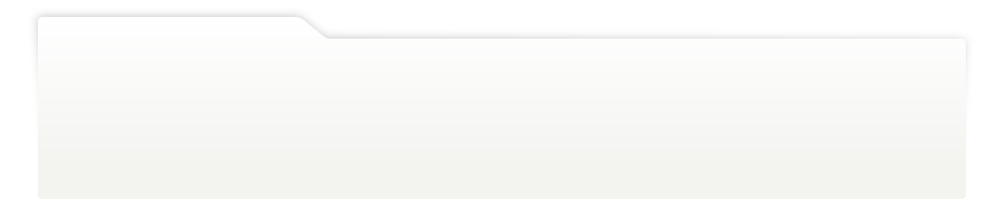
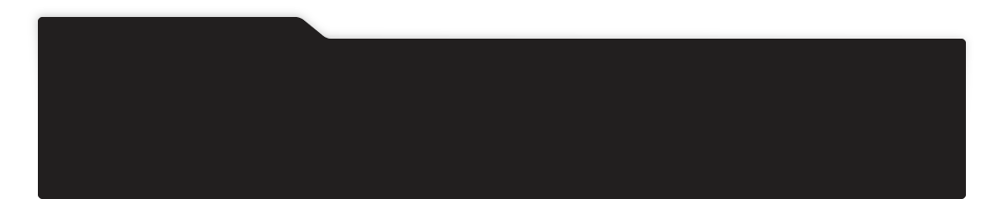
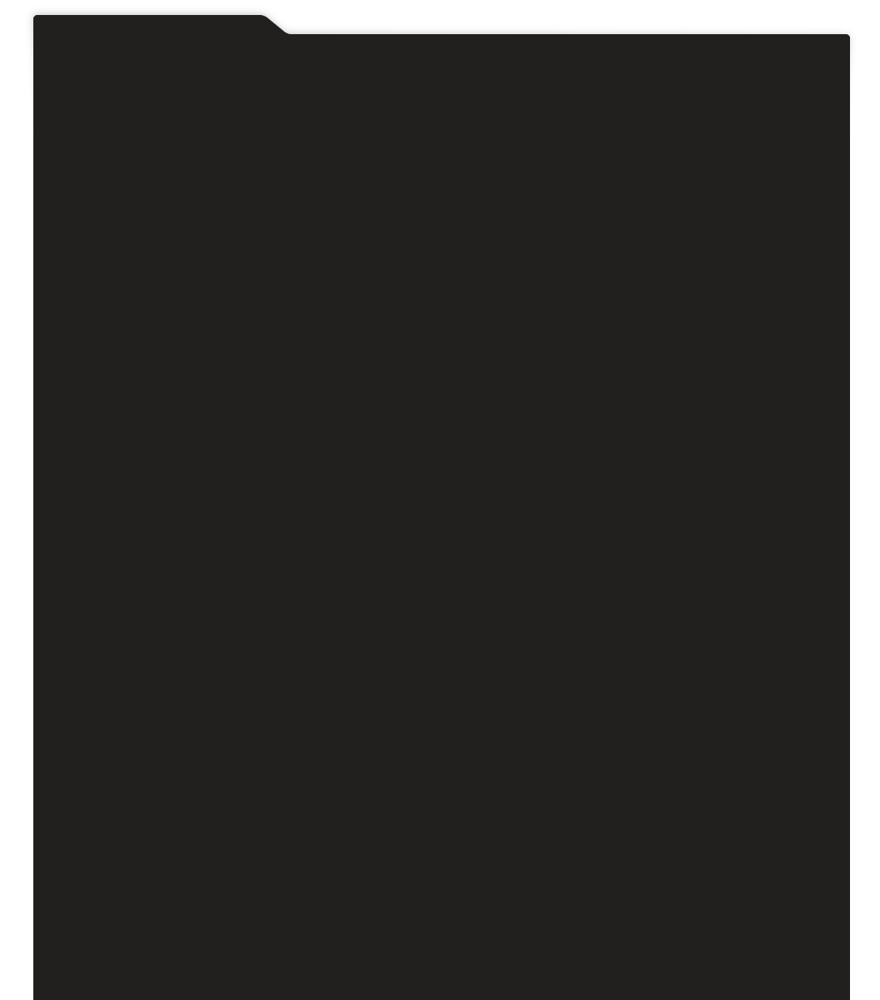
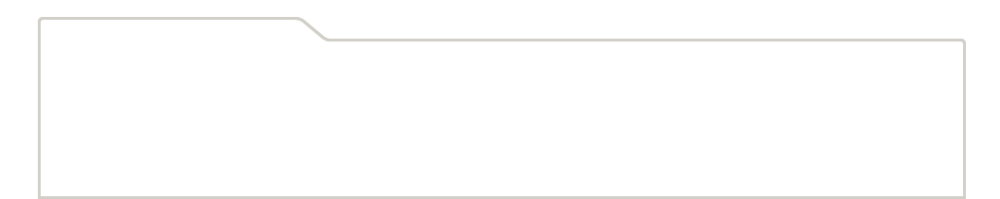
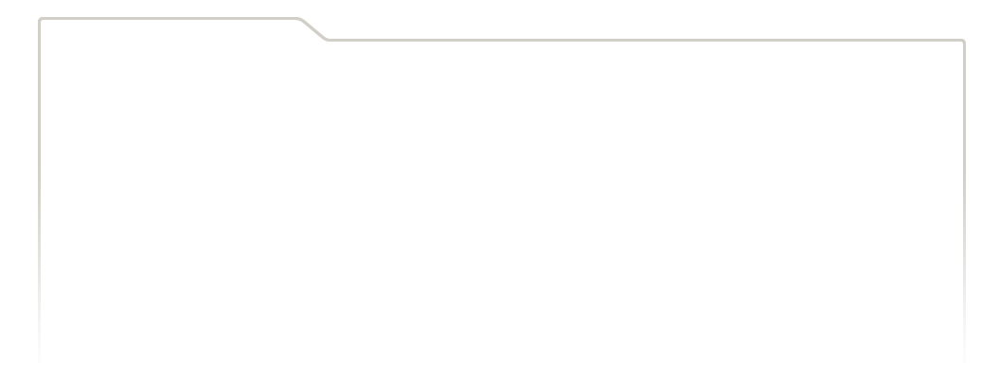
...
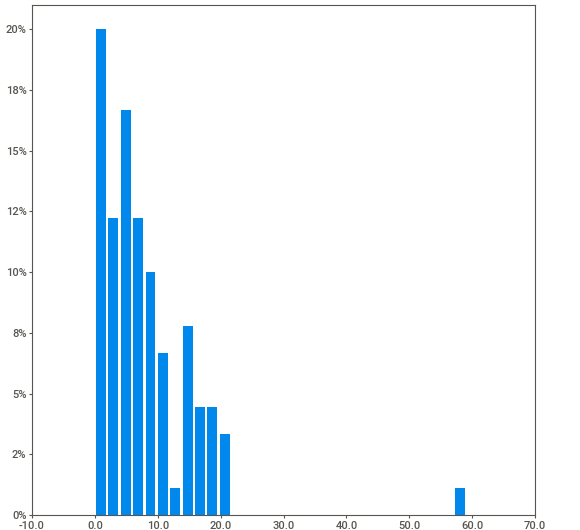
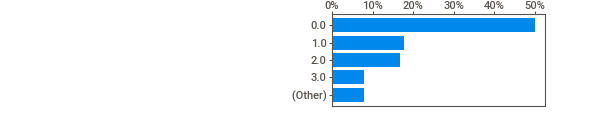
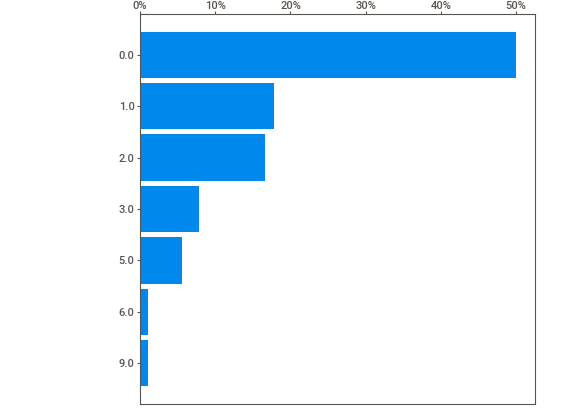
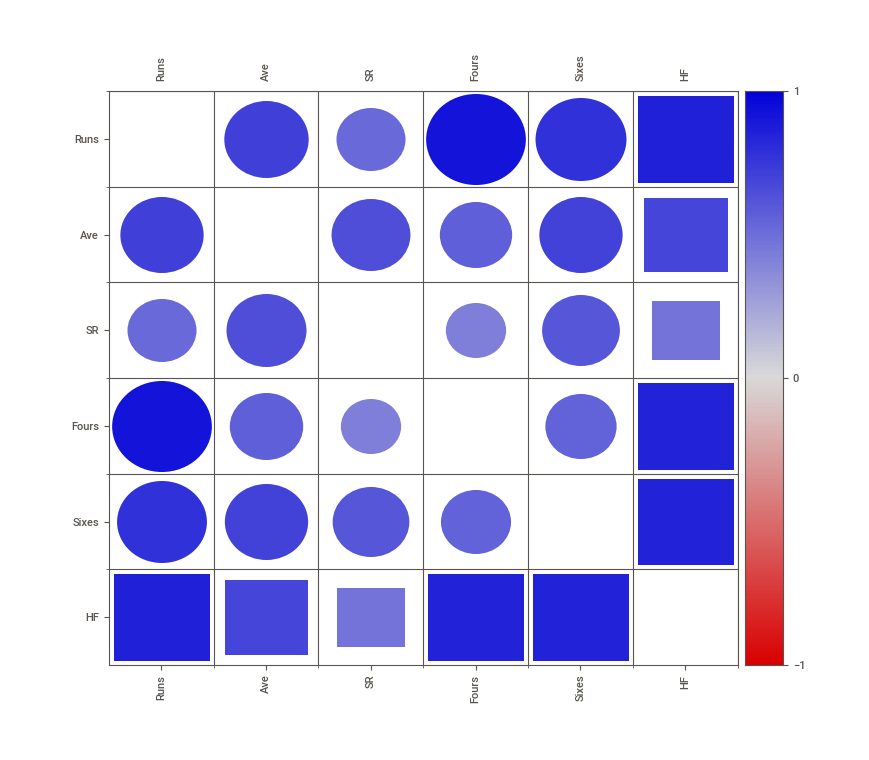
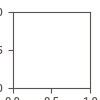

In [142]:
sv.analyze(ipl).show_notebook()

In [143]:
X = ipl

### 2. Build a data driven model to rank all the players in the dataset using all or the most important performance features.


For no. of clusters = 2 , the average silhouette_score is : 0.5696173829870614


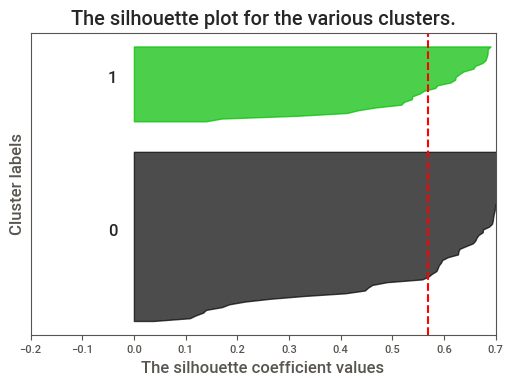

For no. of clusters = 3 , the average silhouette_score is : 0.5191651961836823


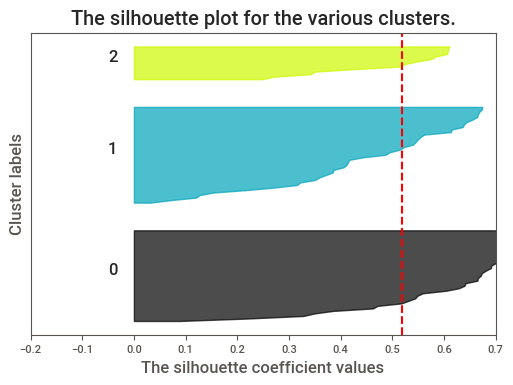

For no. of clusters = 4 , the average silhouette_score is : 0.5211309310419416


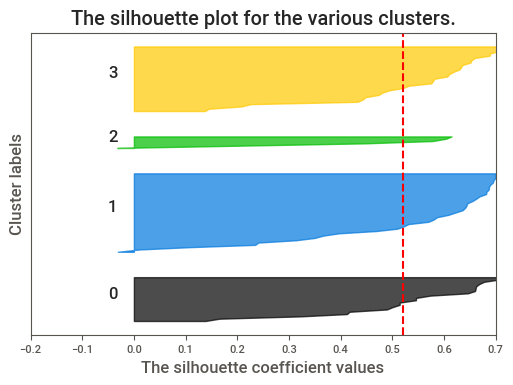

For no. of clusters = 5 , the average silhouette_score is : 0.49133415019922777


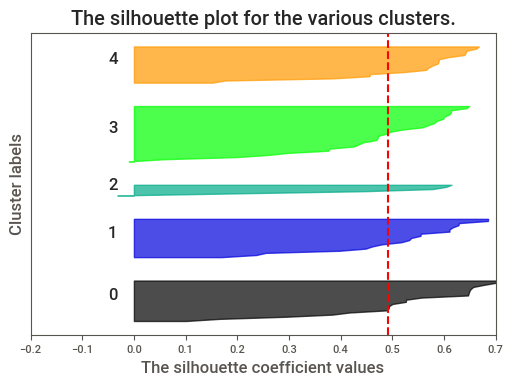

For no. of clusters = 6 , the average silhouette_score is : 0.4795113535312947


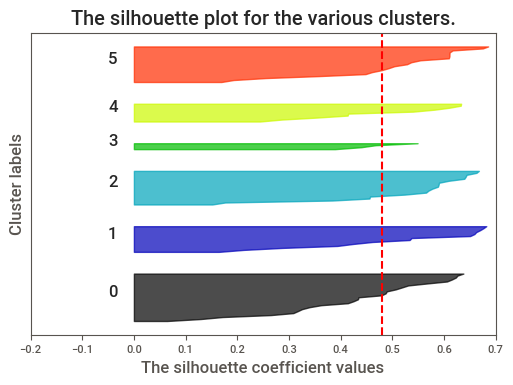

In [144]:
#Let's try using K-means clustering which is most widely used Unsupervised model to see if there are any clusters

#Importing KMeans submodule from cluster module in sklearn library
from sklearn.cluster import KMeans

#Importing metrics module from sklearn library
from sklearn import metrics

#Importing cm module from matplotlib library for ColorMaps
import matplotlib.cm as cm

#Assigning a dummy arrays Cluster_error & cluster_sil_scores
Cluster_error = []
cluster_sil_scores = []

#Defining cluster range from 1 to 7 though the minimum clusters we should find is 3 as it will help visualize Elbow plot
cluster_range = range(1, 7)

#Fit model KMeans for each value of cluster in the range defined in cluster_range
for num_clusters in cluster_range:
    clusters = KMeans(num_clusters, random_state = 5)
    clusters.fit(X)
    Cluster_error.append(clusters.inertia_)
    labels = clusters.labels_

    #Since, 
    if num_clusters == 1:
        cluster_sil_scores.append(np.NaN)
        continue
        
    cluster_sil_scores.append(metrics.silhouette_score(X, labels, metric='euclidean'))

    #The silhouette_score gives the average value for all the samples.
    #This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = metrics.silhouette_score(X, labels)
    print("For no. of clusters =", num_clusters, ", the average silhouette_score is :", silhouette_avg)

    #Compute the silhouette scores for each sample
    sample_silhouette_values = metrics.silhouette_samples(X, labels)
    
    y_lower = 10
    for i in range(num_clusters):
        #Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / num_clusters)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        #Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        #Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples
    
    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster labels")
    plt.yticks([])
    plt.xlim([-0.2, 0.7])

    #The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    #Show the plot for each number of clusters
    plt.show()

In [145]:
cluster_range = range(2,7) 
cluster_errors = []
for num_clusters in cluster_range:
    clusters = KMeans(num_clusters, n_init = 5)
    clusters.fit(X)
    labels = clusters.labels_
    centroids = clusters.cluster_centers_
    cluster_errors.append(clusters.inertia_)
clusters_df = pd.DataFrame( { "num_clusters":cluster_range, "cluster_errors": cluster_errors } )
clusters_df[0:15]

,num_clusters,cluster_errors
0,2,787859.877893
1,3,409837.482456
2,4,247120.865705
3,5,175249.030171
4,6,126182.948870


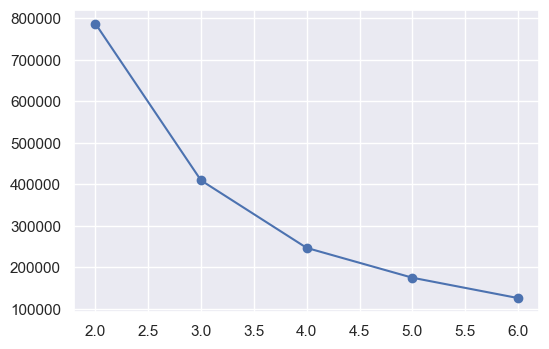

In [146]:
sns.set()
plt.plot(clusters_df.num_clusters, clusters_df.cluster_errors, marker = "o" )
plt.show()
# elbow plot

In [147]:
# Going with n_clusters = 4 from elbow plot
k_means = KMeans(4, random_state = 5)
k_means.fit(X)

KMeans(n_clusters=4, random_state=5)

In [148]:
ipl['Group'] = k_means.labels_

In [149]:
ipl.T

,1,3,5,7,9,11,13,15,17,19,...,161,163,165,167,169,171,173,175,177,179
Runs,733.00,590.00,495.00,479.00,569.00,560.00,305.00,433.00,319.00,244.00,...,32.00,18.0,40.00,19.00,16.00,12.00,19.00,30.00,6.0,2.00
Ave,61.08,36.87,33.00,43.54,40.64,40.00,61.00,30.92,39.87,81.33,...,10.66,6.0,13.33,3.80,5.33,6.00,4.75,5.00,3.0,0.50
SR,160.74,143.55,161.23,149.68,129.61,129.33,147.34,126.60,161.11,128.42,...,106.66,120.0,100.00,90.47,80.00,70.58,70.37,58.82,50.0,18.18
Fours,46.00,64.00,57.00,41.00,58.00,73.00,22.00,39.00,26.00,13.00,...,3.00,2.0,4.00,0.00,1.00,1.00,2.00,4.00,0.0,0.00
Sixes,59.00,17.00,19.00,20.00,18.00,10.00,20.00,18.00,15.00,11.00,...,1.00,0.0,0.00,1.00,0.00,0.00,0.00,0.00,0.0,0.00
HF,9.00,6.00,5.00,5.00,5.00,5.00,3.00,5.00,3.00,2.00,...,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00
Group,2.00,2.00,2.00,2.00,2.00,2.00,0.00,0.00,0.00,3.00,...,1.00,1.0,1.00,1.00,1.00,1.00,1.00,1.00,1.0,1.00


In [150]:
ipl.groupby('Group').mean().T

Group,0,1,2,3
Runs,372.9000,71.228571,571.000000,221.275862
Ave,33.2585,14.172286,42.521667,27.908966
SR,127.4180,107.263143,145.690000,122.346897
Fours,33.6000,5.542857,56.500000,19.862069
Sixes,12.1500,2.285714,23.833333,7.448276
HF,2.1000,0.085714,5.833333,0.931034


In [151]:
ipl.groupby('Group').median().T

Group,0,1,2,3
Runs,363.000,69.00,564.500,220.00
Ave,30.145,13.33,40.320,24.44
SR,127.505,113.69,146.615,115.20
Fours,33.500,4.00,57.500,19.00
Sixes,12.000,1.00,18.500,7.00
HF,2.000,0.00,5.000,1.00


### We can make the following ranks based on the 4 clusters identified by KMeans
#### Group 2: Rank 1 | Highest hitters with maximum runs, ave, sr, fours, sixes and HF
#### Group 0: Rank 2 | Ranked second on average in all metrics
#### Group 3: Rank 3 | Ranked third on average in all metrics
#### Group 1: Rank 4 | Lowers hitters with least runs, ave, sr, fours, sixes and HF

#### These clusters should help take the business decisions for the sports management companies by the ranking from the analysis


In [152]:
ipl['Name'] = names

In [153]:
ipl['Rank'] = ipl.Group.replace({2.0: 1, 0.0: 2, 3.0: 3, 1.0: 4})

In [154]:
ipl.drop(['Group'], inplace = True, axis = 1)
ipl.T

,1,3,5,7,9,11,13,15,17,19,...,161,163,165,167,169,171,173,175,177,179
Runs,733,590,495,479,569,560,305,433,319,244,...,32,18,40,19,16,12,19,30,6,2
Ave,61.08,36.87,33,43.54,40.64,40,61,30.92,39.87,81.33,...,10.66,6,13.33,3.8,5.33,6,4.75,5,3,0.5
SR,160.74,143.55,161.23,149.68,129.61,129.33,147.34,126.6,161.11,128.42,...,106.66,120,100,90.47,80,70.58,70.37,58.82,50,18.18
Fours,46,64,57,41,58,73,22,39,26,13,...,3,2,4,0,1,1,2,4,0,0
Sixes,59,17,19,20,18,10,20,18,15,11,...,1,0,0,1,0,0,0,0,0,0
HF,9,6,5,5,5,5,3,5,3,2,...,0,0,0,0,0,0,0,0,0,0
Name,CH Gayle,G Gambhir,V Sehwag,CL White,S Dhawan,AM Rahane,KP Pietersen,RG Sharma,AB de Villiers,JP Duminy,...,RJ Peterson,R Ashwin,B Kumar,DW Steyn,A Mishra,Z Khan,WD Parnell,PC Valthaty,RP Singh,R Sharma
Rank,1,1,1,1,1,1,2,2,2,3,...,4,4,4,4,4,4,4,4,4,4


In [155]:
from pprint import pprint
for rank, rank_df in ipl.groupby('Rank'):
    print(f'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~Rank: {rank}~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')
    print(f'\t\t\t\t    {len(rank_df)} Members')
    pprint(list(rank_df.Name), compact = True, indent = 2)
    print()

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~Rank: 1~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
				    6 Members
['CH Gayle', 'G Gambhir', 'V Sehwag', 'CL White', 'S Dhawan', 'AM Rahane']

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~Rank: 2~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
				    20 Members
[ 'KP Pietersen', 'RG Sharma', 'AB de Villiers', 'F du Plessis', 'OA Shah',
  'DJ Bravo', 'DJ Hussey', 'SK Raina', 'AT Rayudu', 'Mandeep Singh', 'R Dravid',
  'M Vijay', 'SPD Smith', 'RV Uthappa', 'SE Marsh', 'DMD Jayawardene',
  'V Kohli', 'SR Tendulkar', 'JH Kallis', 'MS Dhoni']

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~Rank: 3~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
				    29 Members
[ 'JP Duminy', 'DA Warner', 'SR Watson', 'DR Smith', 'TM Dilshan', 'KA Pollard',
  'MA Agarwal', 'MEK Hussey', 'MS Bisla', 'JD Ryder', 'BJ Hodge', 'NV Ojha',
  'AC Gilchrist', 'BB McCullum', 'IK Pathan', 'Azhar Mahmood', 'S Badrinath',
  'MK Tiwary', 'LRPL Taylor', 'RA Jadeja', 'JEC Franklin', 'KC Sangakkara',
  'Y Nagar', 'SS Tiwary', '

### The Cricketers segregated into ranks for the use of the sports management company

# Part Five


### List down all possible dimensionality reduction techniques that can be implemented using python.

#####  **Dimensionality reduction** is the transformation of data from a high-dimensional space into a low-dimensional space so that the low-dimensional representation retains some meaningful properties of the original data, ideally close to its intrinsic dimension. Working in high-dimensional spaces can be undesirable for many reasons; raw data are often sparse as a consequence of the curse of dimensionality, and analyzing the data is usually computationally intractable. Dimensionality reduction is common in fields that deal with large numbers of observations and/or large numbers of variables, such as signal processing, speech recognition, neuroinformatics, and bioinformatics.

### Dimensionality Reduction techniques that can be implemented in python:

* **Missing Values Ratio**: If there are too many missing values in a column in a dataset, The ratio of missing values can be computed and if it exceeds certain preset threshold, the column could be dropped.
* **Low Variance Filter** If there is no variance or near zero variance exhibited in some variables. In other words, if all the values are equal or very similar in a particular column, This column doesn't add any useful information for the model. So, variance in each column could be computed to filter out certain columsn if threshold isn't met. Variance is range dependent; therefore normalization is required before applying this technique.
* **High Correlation Filter** If there are variables with high correlation. Some models will be affected if we use all variables. As, they cannot differentiate between feature importance or weights for the correlated variables. Hence, all but one of the highly correlated variables could be dropped based on the correlations with target variable or bsed on business understanding. Correlation is scale sensitive; therefore column normalization is required for a meaningful correlation comparison.
* **Random Forests / Ensemble Trees** We can compute feature importances for each variable after a random forst is trained as done above. So, the importance of each variable for predicting the target column could be ascertained and if the importance is very low, Those features could be removed in feature selection and models can be trained on remaining data.
* **Principal Component Analysis (PCA)** Principal Component Analysis (PCA) is a statistical procedure that orthogonally transforms the original n coordinates of a data set into a new set of n coordinates called principal components. As a result of the transformation, the first principal component has the largest possible variance; each succeeding component has the highest possible variance under the constraint that it is orthogonal to (i.e., uncorrelated with) the preceding components. Keeping only the first m < n components reduces the data dimensionality while retaining most of the data information, i.e. the variation in the data. If interpretability of the results is important for your analysis, PCA cannot be applied. Otherwise, it's helpful in dimensionality reduction
* **Backward Feature Elimination** In this technique, at a given iteration, the selected classification algorithm is trained on n input features. Then we remove one input feature at a time and train the same model on n-1 input features n times. The input feature whose removal has produced the smallest increase in the error rate is removed, leaving us with n-1 input features. The classification is then repeated using n-2 features, and so on. Each iteration k produces a model trained on n-k features and an error rate e(k). Selecting the maximum tolerable error rate, we define the smallest number of features necessary to reach that classification performance with the selected machine learning algorithm.
* **Forward Feature Construction** This is the inverse process to the Backward Feature Elimination. We start with 1 feature only, progressively adding 1 feature at a time, i.e. the feature that produces the highest increase in performance. Both algorithms, Backward Feature Elimination and Forward Feature Construction, are quite time and computationally expensive. They are practically only applicable to a data set with an already relatively low number of input columns.
* **Linear Discriminant Analysis (LDA)** A number m of linear combinations (discriminant functions) of the n input features, with m < n, are produced to be uncorrelated and to maximize class separation. These discriminant functions become the new basis for the dataset. All numeric columns in the dataset are projected onto these linear discriminant functions, effectively moving the dataset from the n-dimensionality to the m-dimensionality.
* **Autoencoder** An autoencoder is a neural network, with as many n output units as input units, at least one hidden layer with m units where m < n, and trained with the backpropagation algorithm to reproduce the input vector onto the output layer. It reduces the numeric columns in the data by using the output of the hidden layer to represent the input vector.
    * The first part of the autoencoder — from the input layer to the hidden layer of m units — is called the encoder. It compresses the n dimensions of the input dataset into an m-dimensional space. The second part of the autoencoder — from the hidden layer to the output layer — is known as the decoder. The decoder expands the data vector from an m-dimensional space into the original n-dimensional dataset and brings the data back to their original values.
* **t-distributed Stochastic Neighbor Embedding (t-SNE)** This technique reduces the n numeric columns in the dataset to fewer dimensions m (m < n) based on nonlinear local relationships among the data points. Specifically, it models each high-dimensional object by a two- or three-dimensional point in such a way that similar objects are modeled by nearby points and dissimilar objects are modeled by distant points in the new lower dimensional space.
    * In the first step, the data points are modeled through a multivariate normal distribution of the numeric columns. In the second step, this distribution is replaced by a lower dimensional t-distribution, which follows the original multivariate normal distribution as closely as possible. The t-distribution gives the probability of picking another point in the dataset as a neighbor to the current point in the lower dimensional space. The perplexity parameter controls the density of the data as the “effective number of neighbors for any point.” The greater the value of the perplexity, the more global structure is considered in the data. The t-SNE technique works only on the current dataset. It is not possible to export the model to apply it to new data.

sources:[1](https://www.kdnuggets.com/2015/05/7-methods-data-dimensionality-reduction.html), [2](https://thenewstack.io/3-new-techniques-for-data-dimensionality-reduction-in-machine-learning/) [3](https://en.wikipedia.org/wiki/Dimensionality_reduction)

### So far you have used dimensional reduction on numeric data. Is it possible to do the same on a multimedia data [images and video] and text data ? Please illustrate your findings using a simple implementation on python.

(80, 364, 4)


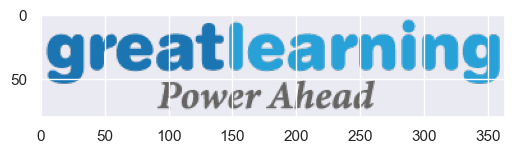

In [156]:
import matplotlib.image as mplib 
X = mplib.imread('greatlearning-logo.png')
print(X.shape)
plt.imshow(X)

In [157]:
X_flat = np.array(X).reshape((80, 364*4)) # flatten

In [158]:
# dimensionality reduction on the image vector (16 components)
pca = PCA(16).fit(X_flat)
X_transform = pca.transform(X_flat) 
print('Princial Components: ', X_transform.shape)
print(np.sum(pca.explained_variance_ratio_)) # variance explained/preserved

Princial Components:  (80, 16)
0.9528581


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Compresed shape: (80, 1456)
Compresed shape after inverse Transform: (80, 364, 4)


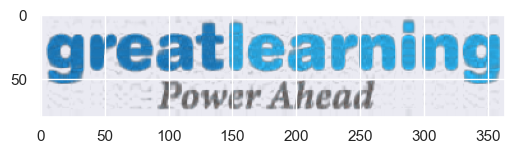

In [159]:
# Retrieving the results of the image after Dimension reduction.
compressed = pca.inverse_transform(X_transform) 
print('Compresed shape:', compressed.shape)
compressed = np.reshape(compressed, (80, 364, 4)) 
print('Compresed shape after inverse Transform:', compressed.shape) 
plt.imshow(compressed)

In [160]:
# dimensionality reduction on the image vector (32 components)
pca = PCA(32).fit(X_flat)
X_transform = pca.transform(X_flat) 
print('Princial Components: ', X_transform.shape)
print(np.sum(pca.explained_variance_ratio_))

Princial Components:  (80, 32)
0.98632085


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Compresed shape: (80, 1456)
Compresed shape after inverse Transform: (80, 364, 4)


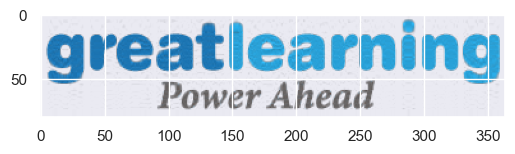

In [161]:
# Retrieving the results of the image after Dimension reduction
compressed = pca.inverse_transform(X_transform) 
print('Compresed shape:', compressed.shape)
compressed = np.reshape(compressed, (80, 364, 4)) 
print('Compresed shape after inverse Transform:', compressed.shape) 
plt.imshow(compressed)

### Hence, we can see that the image colors and contours is retained and the quality degradation is not too much albeit it isn't a lossless compression as some information is lost when the principal components are computed.

In [162]:
# dimensionality reduction on the image vector (64 components)
pca = PCA(64).fit(X_flat)
X_transform = pca.transform(X_flat) 
print('Princial Components: ', X_transform.shape)
print(np.sum(pca.explained_variance_ratio_) )

Princial Components:  (80, 64)
0.99979043


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Compresed shape: (80, 1456)
Compresed shape after inverse Transform: (80, 364, 4)


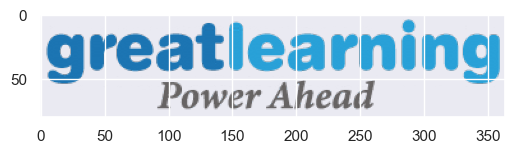

In [163]:
# Retrieving the results of the image after Dimension reduction.
compressed = pca.inverse_transform(X_transform) 
print('Compresed shape:', compressed.shape)
compressed = np.reshape(compressed, (80, 364, 4)) 
print('Compresed shape after inverse Transform:', compressed.shape) 
plt.imshow(compressed)

### More the number of principal components are used, the higher the quality and mroe the information is preserved depending on how much dimensions we want to reduce. This transformed data can be used for deep learning based image classification/ recognition or other models which use image to work without the problem of curse of dimensionality. Similarly, Dimensionality reduction could be employed for other types of data.